## Setting Up:

In [7]:
import pandas as pd
import os
import warnings
from tqdm.notebook import tqdm
import re
from calendar import month_abbr
import matplotlib.pyplot as plt
import seaborn as sns
from cmcrameri import cm
import xarray as xr
import massbalancemachine as mbm
from collections import defaultdict
import logging

from scripts.helpers import *
from scripts.iceland_preprocess import *
from scripts.plots import *
from scripts.config_ICE import *
from scripts.xgb_helpers import *


# Initialize logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(message)s')

warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2

cfg = mbm.IcelandConfig()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
seed_all(cfg.seed)
free_up_cuda()

# Plot styles:
path_style_sheet = 'scripts/example.mplstyle'
plt.style.use(path_style_sheet)
colors = get_cmap_hex(cm.batlow, 10)
color_dark_blue = colors[0]
color_pink = '#c51b7d'

vois_climate = [
    't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10'
]

vois_topographical = [
    "aspect", # OGGM
    "slope", # OGGM
    "consensus_ice_thickness",  # OGGM
    "millan_v",  # OGGM
]

## Read Stake data:

In [4]:
data_wgms = pd.read_csv(path_PMB_WGMS_csv + 'ICE_dataset_all_oggm.csv')

print('Number of glaciers:', len(data_wgms['GLACIER'].unique()))
print('Number of winter, summer and annual samples:', len(data_wgms[data_wgms.PERIOD == 'annual']) + len(data_wgms[data_wgms.PERIOD == 'winter']) + len(data_wgms[data_wgms.PERIOD == 'summer']))
print('Number of annual samples:',
      len(data_wgms[data_wgms.PERIOD == 'annual']))
print('Number of winter samples:',
      len(data_wgms[data_wgms.PERIOD == 'winter']))
print('Number of summer samples:',
      len(data_wgms[data_wgms.PERIOD == 'summer']))

data_wgms.columns

Number of glaciers: 49
Number of winter, summer and annual samples: 6586
Number of annual samples: 3205
Number of winter samples: 3381
Number of summer samples: 0


Index(['POINT_ELEVATION', 'POINT_LAT', 'POINT_LON', 'FROM_DATE', 'TO_DATE',
       'POINT_BALANCE', 'PERIOD', 'YEAR', 'RGIId', 'aspect', 'slope', 'topo',
       'consensus_ice_thickness', 'millan_v', 'GLACIER', 'POINT_ID'],
      dtype='object')

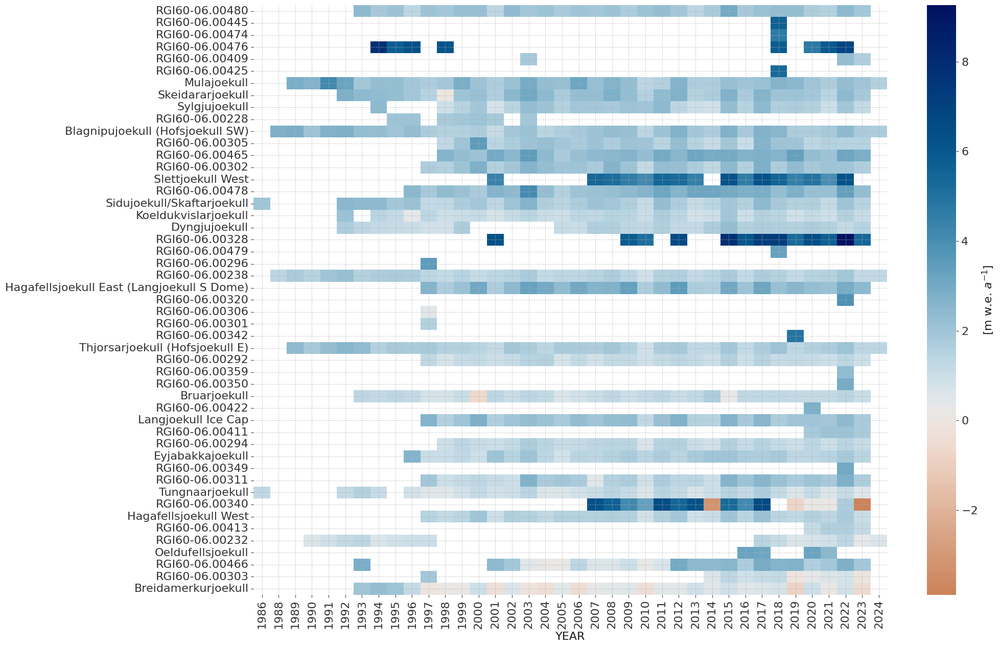

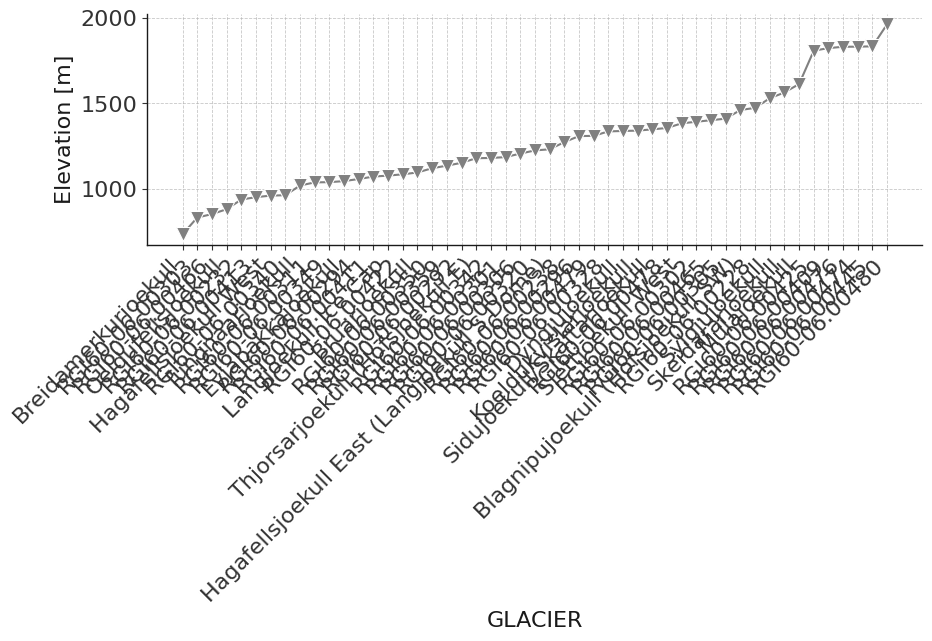

In [5]:
# Heatmap of mean mass balance per glacier:
# Get the mean mass balance per glacier

mean_mb_per_glacier = data_wgms.copy()
mean_mb_per_glacier['YEAR'] = mean_mb_per_glacier['TO_DATE'].astype(str).str[:4].astype(int)

mean_mb_per_glacier = mean_mb_per_glacier.groupby(
    ['GLACIER', 'YEAR', 'PERIOD'])['POINT_BALANCE'].mean().reset_index()
mean_mb_per_glacier = mean_mb_per_glacier[mean_mb_per_glacier['PERIOD'] == 'winter']

matrix = mean_mb_per_glacier.pivot(
    index='GLACIER', columns='YEAR',
    values='POINT_BALANCE').sort_values(by='GLACIER')

# get elevation of glaciers:
gl_per_el = data_wgms.groupby(['GLACIER'])['POINT_ELEVATION'].mean()
gl_per_el = gl_per_el.sort_values(ascending=False)

# Order matrix:
matrix = matrix.loc[gl_per_el.index]
matrix.index = pd.Categorical(matrix.index,
                              categories=matrix.index,
                              ordered=True)

# Plot heatmap:
fig = plt.figure(figsize=(20, 15))
ax = plt.subplot(1, 1, 1)
heatmap = sns.heatmap(
    data=matrix,
    center=0,
    cmap=cm.vik_r,
    cbar_kws={'label': '[m w.e. $a^{-1}$]'},
    ax=ax,
)

# Plot elevation:
fig = plt.figure(figsize=(10, 3))  # Made figure slightly taller for labels
ax = plt.subplot(1, 1, 1)
sorted_elevations = gl_per_el.sort_values(ascending=True)

sns.lineplot(sorted_elevations,
             ax=ax,
             color='gray',
             marker='v')

# Add glacier names as x-tick labels
ax.set_xticks(range(len(sorted_elevations)))
ax.set_xticklabels(sorted_elevations.index, rotation=45, ha='right')
ax.set_ylabel('Elevation [m]')
plt.tight_layout()

## Add ERA5 data to stake data

In [8]:
data_wgms_test = data_wgms.copy()

# Transform data to monthly format (run or load data):
paths = {
    'csv_path': path_PMB_WGMS_csv,
    'era5_climate_data': path_ERA5_raw + 'era5_monthly_averaged_data_ICECH.nc',
    'geopotential_data': path_ERA5_raw + 'era5_geopotential_pressure_ICECH.nc'
    #'radiation_save_path': path_pcsr + 'zarr/'
}

RUN = True
dataloader_gl = process_or_load_data(run_flag=RUN,
                                     df=data_wgms_test,
                                     paths=paths,
                                     cfg=cfg,
                                     vois_climate=vois_climate,
                                     vois_topographical=vois_topographical,
                                     output_file='ICE_dataset_monthly_full.csv')
data_monthly = dataloader_gl.data

display(data_monthly.head(2))

2025-06-04 22:56:50,195 - INFO - Number of annual and seasonal samples: 6586
2025-06-04 22:56:50,197 - INFO - Running on 49 glaciers:
['Skeidararjoekull' 'Dyngjujoekull' 'Breidamerkurjoekull' 'RGI60-06.00303'
 'Langjoekull Ice Cap' 'Hagafellsjoekull West'
 'Sidujoekull/Skaftarjoekull' 'Koeldukvislarjoekull' 'RGI60-06.00359'
 'RGI60-06.00238' 'Hagafellsjoekull East (Langjoekull S Dome)'
 'RGI60-06.00466' 'Tungnaarjoekull' 'RGI60-06.00232' 'Bruarjoekull'
 'RGI60-06.00411' 'RGI60-06.00422' 'RGI60-06.00292' 'RGI60-06.00328'
 'RGI60-06.00340' 'Blagnipujoekull (Hofsjoekull SW)' 'RGI60-06.00294'
 'RGI60-06.00302' 'RGI60-06.00311' 'Oeldufellsjoekull' 'Eyjabakkajoekull'
 'RGI60-06.00320' 'RGI60-06.00478' 'RGI60-06.00465' 'RGI60-06.00301'
 'RGI60-06.00305' 'RGI60-06.00409' 'Sylgjujoekull'
 'Thjorsarjoekull (Hofsjoekull E)' 'RGI60-06.00480' 'RGI60-06.00476'
 'RGI60-06.00413' 'RGI60-06.00350' 'Mulajoekull' 'RGI60-06.00349'
 'Slettjoekull West' 'RGI60-06.00228' 'RGI60-06.00342' 'RGI60-06.00425'
 'R

KeyError: "['t2m_nan', 'tp_nan', 'slhf_nan', 'sshf_nan', 'ssrd_nan', 'fal_nan', 'str_nan', 'u10_nan', 'v10_nan'] not in index"

#### Feature Correlation

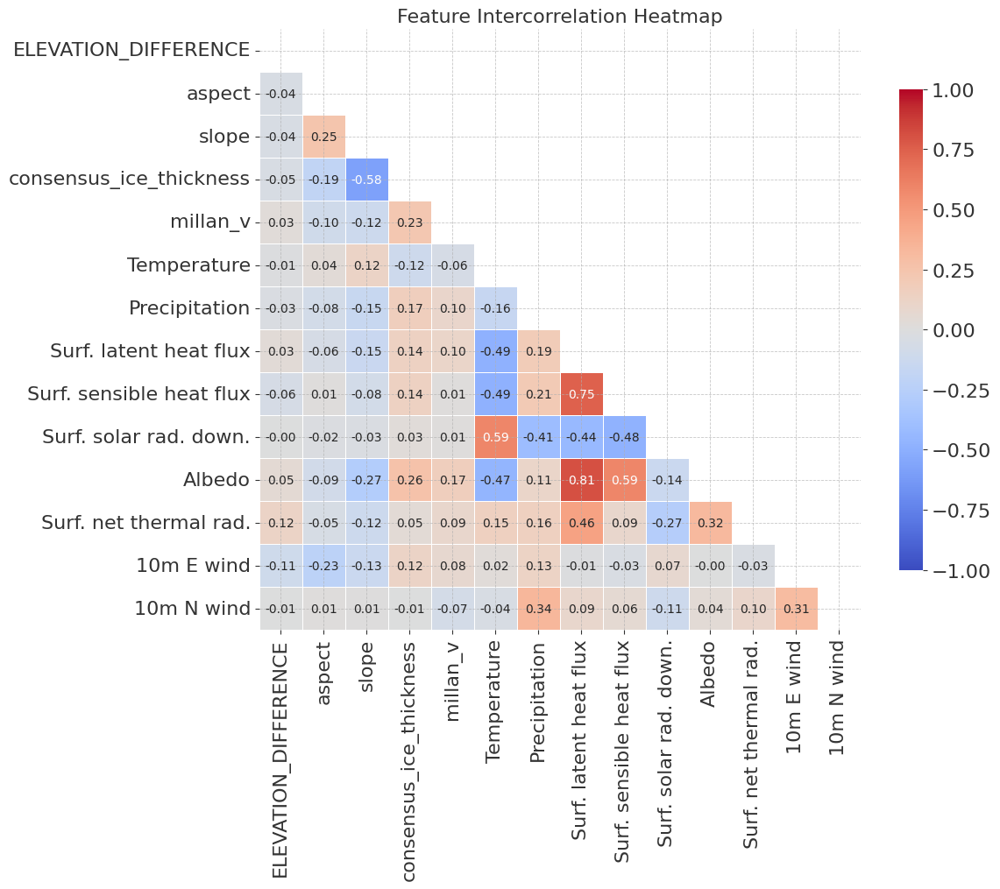

In [6]:
# Prepare data for correlation analysis
df = dataloader_gl.data.copy().dropna()

# Define the columns to keep
columns_to_keep = [
    col for col in df.columns if col not in [
        'GLACIER', 'PERIOD', 'YEAR', 'POINT_LON', 'POINT_LAT', 'POINT_BALANCE',
        'ALTITUDE_CLIMATE', 'POINT_ELEVATION', 'RGIId', 'POINT_ID', 'ID',
        'GLWD_ID', 'N_MONTHS', 'MONTHS'
    ]
]
df = df[columns_to_keep]

# Rename columns based on long names (if applicable)
df.rename(columns=vois_climate_long_name, inplace=True)

# Compute correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(12, 10))

# Plot the heatmap
sns.heatmap(
    corr,
    mask=mask,
    cmap='coolwarm',
    vmax=1,
    vmin=-1,
    center=0,
    annot=True,  # Add correlation values
    fmt=".2f",
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": 0.8})

# Enhance readability
plt.title("Feature Intercorrelation Heatmap", fontsize=16)
plt.tight_layout()

# Show the plot
plt.show()

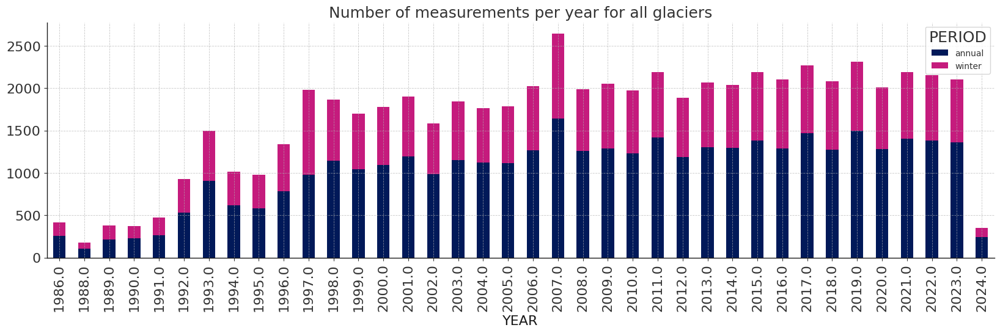

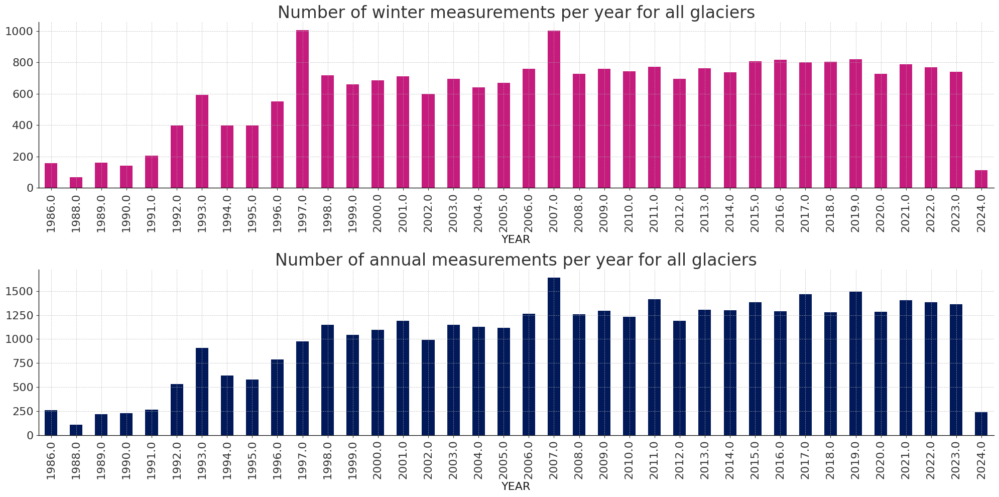

In [7]:
# Number of measurements per year:
dataloader_gl.data.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar',
    stacked=True,
    figsize=(20, 5),
    color=[color_dark_blue, color_pink])
plt.title('Number of measurements per year for all glaciers')

# Plot winter and annual separately:
fig, axs = plt.subplots(2, 1, figsize=(20, 10), sharey=False)
dataloader_gl.data[dataloader_gl.data.PERIOD == 'winter'].groupby(
    ['YEAR', 'PERIOD']).size().unstack().plot(kind='bar',
                                              ax=axs[0],
                                              color=[color_pink],
                                              legend=False)
axs[0].set_title('Number of winter measurements per year for all glaciers',
                 fontsize=24)

dataloader_gl.data[dataloader_gl.data.PERIOD == 'annual'].groupby(
    ['YEAR', 'PERIOD']).size().unstack().plot(kind='bar',
                                              stacked=True,
                                              ax=axs[1],
                                              color=[color_dark_blue],
                                              legend=False)
axs[1].set_title('Number of annual measurements per year for all glaciers',
                 fontsize=24)
plt.tight_layout()

#### Sanity Check

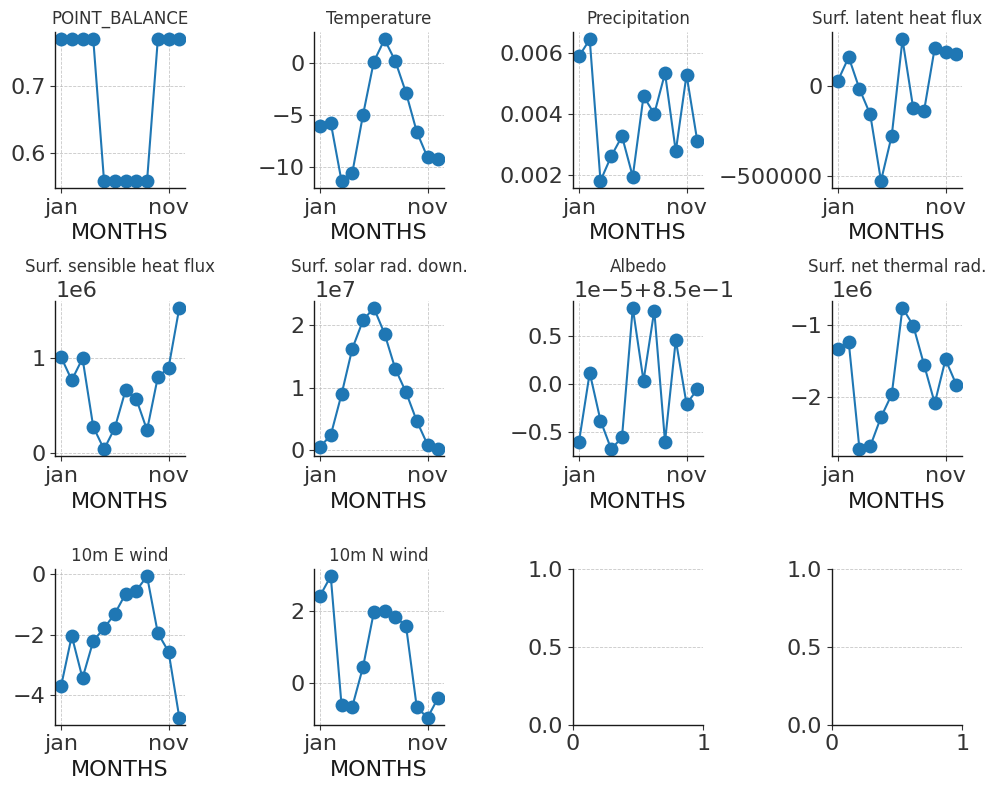

In [8]:
# Sanity check of variables:
df = dataloader_gl.data
var_to_plot = ['POINT_BALANCE'] + vois_climate
df = df[(df.GLACIER == 'Sylgjujoekull') & (df.YEAR == 2013)].groupby(
    ['MONTHS'])[var_to_plot].mean().reset_index()
df['month_nb'] = df.MONTHS.apply(
    lambda x: list(month_abbr).index(x.capitalize()))
df.sort_values(by='month_nb', inplace=True)
fig, ax = plt.subplots(3, 4, figsize=(10, 8))

for i, var in enumerate(var_to_plot):
    df.plot(x='MONTHS', y=var, marker='o', ax=ax.flatten()[i], legend=False)
    if var in vois_climate_long_name.keys():
        ax.flatten()[i].set_title(vois_climate_long_name[var], fontsize=12)
    else:
        ax.flatten()[i].set_title(var, fontsize=12)
plt.tight_layout()

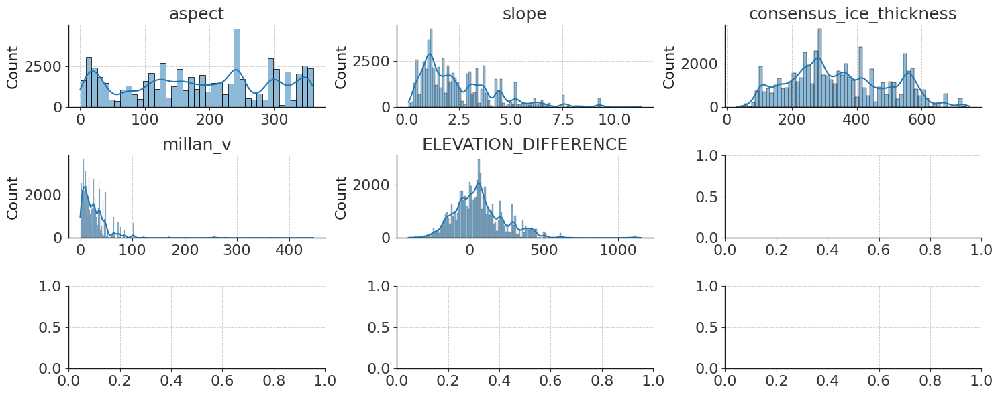

In [9]:
# Plot the distribution of the topo variables:
df = dataloader_gl.data
fig, axs = plt.subplots(3, 3, figsize=(15, 6))
for i, var in enumerate(vois_topographical + ['ELEVATION_DIFFERENCE']):
    ax = axs.flatten()[i]
    sns.histplot(df[var], ax=ax, kde=True)
    ax.set_xlabel('')
    ax.set_title(var)
plt.tight_layout()

###### Remove summer rows if present

In [ ]:
# Remove summer stakes
dataloader_gl.data = dataloader_gl.data[dataloader_gl.data['PERIOD'] != 'summer']
dataloader_gl.data = dataloader_gl.data.reset_index(drop=True)
data_monthly = dataloader_gl.data

display(dataloader_gl.data['PERIOD'].unique())

array(['Thjorsarjoekull (Hofsjoekull E)', 'Sidujoekull/Skaftarjoekull',
       'Breidamerkurjoekull', 'Dyngjujoekull', 'RGI60-06.00328',
       'Tungnaarjoekull', 'Hagafellsjoekull West', 'Eyjabakkajoekull',
       'RGI60-06.00303', 'Langjoekull Ice Cap', 'Koeldukvislarjoekull',
       'Oeldufellsjoekull', 'Skeidararjoekull', 'Slettjoekull West',
       'RGI60-06.00466', 'RGI60-06.00411', 'RGI60-06.00302',
       'RGI60-06.00359', 'RGI60-06.00340', 'Bruarjoekull',
       'Blagnipujoekull (Hofsjoekull SW)', 'RGI60-06.00238',
       'RGI60-06.00320', 'Sylgjujoekull',
       'Hagafellsjoekull East (Langjoekull S Dome)', 'RGI60-06.00342',
       'RGI60-06.00480', 'RGI60-06.00465', 'RGI60-06.00294',
       'RGI60-06.00292', 'RGI60-06.00232', 'RGI60-06.00478',
       'Mulajoekull', 'RGI60-06.00301', 'RGI60-06.00413',
       'RGI60-06.00311', 'RGI60-06.00350', 'RGI60-06.00476',
       'RGI60-06.00228', 'RGI60-06.00409', 'RGI60-06.00349',
       'RGI60-06.00422', 'RGI60-06.00305', 'RGI60-06.00

array(['annual', 'winter'], dtype=object)

array(['Hagafellsjoekull West', 'RGI60-06.00303', 'Langjoekull Ice Cap',
       'RGI60-06.00302', 'Hagafellsjoekull East (Langjoekull S Dome)',
       'RGI60-06.00294', 'RGI60-06.00292', 'RGI60-06.00301',
       'RGI60-06.00311', 'RGI60-06.00305', 'RGI60-06.00306',
       'RGI60-06.00296'], dtype=object)

#### Spatial Distribution

###### Find GLACIER names of the two icecaps to the north-west

In [ ]:
Langjokul = dataloader_gl.data[
    (dataloader_gl.data['POINT_LON'] < -19.4) & 
    (dataloader_gl.data['POINT_LAT'] > 64.3)
]['GLACIER'].unique()
display(Langjokul)

###### Create Test and Train set

In [11]:
test_glaciers = ['Hagafellsjoekull West', 'RGI60-06.00303', 'Langjoekull Ice Cap',
       'RGI60-06.00302', 'Hagafellsjoekull East (Langjoekull S Dome)',
       'RGI60-06.00294', 'RGI60-06.00292', 'RGI60-06.00301',
       'RGI60-06.00311', 'RGI60-06.00305', 'RGI60-06.00306',
       'RGI60-06.00296']

# Ensure all test glaciers exist in the dataset
existing_glaciers = set(dataloader_gl.data.GLACIER.unique())
missing_glaciers = [g for g in test_glaciers if g not in existing_glaciers]

if missing_glaciers:
    print(
        f"Warning: The following test glaciers are not in the dataset: {missing_glaciers}"
    )

# Define training glaciers correctly
train_glaciers = [i for i in existing_glaciers if i not in test_glaciers]

data_test = dataloader_gl.data[dataloader_gl.data.GLACIER.isin(test_glaciers)]
print('Size of test data:', len(data_test))

data_train = dataloader_gl.data[dataloader_gl.data.GLACIER.isin(
    train_glaciers)]
print('Size of train data:', len(data_train))

if len(data_train) == 0:
    print("Warning: No training data available!")
else:
    test_perc = (len(data_test) / len(data_train)) * 100
    print('Percentage of test size: {:.2f}%'.format(test_perc))

# Number of annual versus winter measurements:
print('Train:')
print('Number of winter and annual samples:', len(data_train))
print('Number of annual samples:',
      len(data_train[data_train.PERIOD == 'annual']))
print('Number of winter samples:',
      len(data_train[data_train.PERIOD == 'winter']))

# Same for test
data_test_annual = data_test[data_test.PERIOD == 'annual']
data_test_winter = data_test[data_test.PERIOD == 'winter']

print('Test:')
print('Number of winter and annual samples:', len(data_test))
print('Number of annual samples:', len(data_test_annual))
print('Number of winter samples:', len(data_test_winter))

print('Total:')
print('Number of monthly rows:', len(dataloader_gl.data))
print('Number of annual rows:',
      len(dataloader_gl.data[dataloader_gl.data.PERIOD == 'annual']))
print('Number of winter rows:',
      len(dataloader_gl.data[dataloader_gl.data.PERIOD == 'winter']))

Size of test data: 11417
Size of train data: 51008
Percentage of test size: 22.38%
Train:
Number of winter and annual samples: 51008
Number of annual samples: 31520
Number of winter samples: 19488
Test:
Number of winter and annual samples: 11417
Number of annual samples: 7306
Number of winter samples: 4111
Total:
Number of monthly rows: 62425
Number of annual rows: 38826
Number of winter rows: 23599


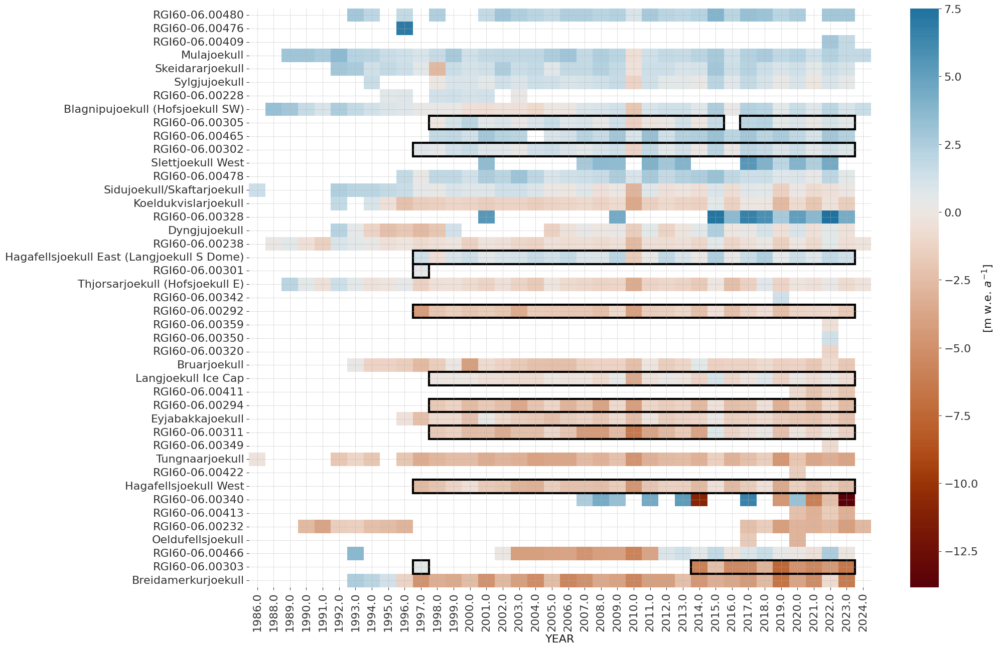

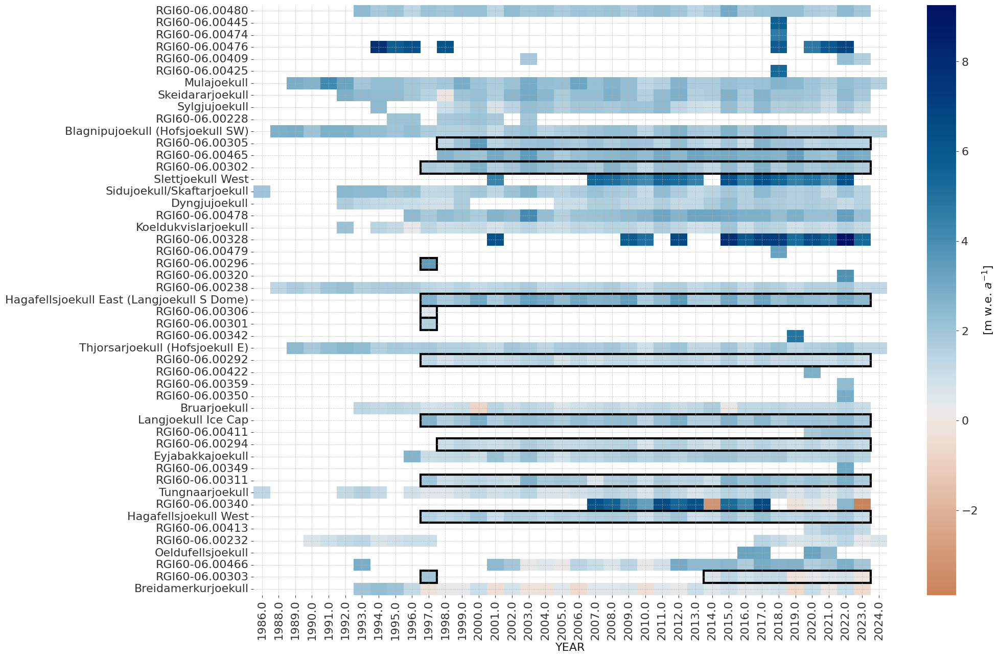

In [12]:
plotHeatmap(test_glaciers, data_monthly, period='annual')

plotHeatmap(test_glaciers, data_monthly, period='winter')

Test glaciers: (12) ['Hagafellsjoekull West' 'RGI60-06.00303' 'Langjoekull Ice Cap'
 'RGI60-06.00302' 'Hagafellsjoekull East (Langjoekull S Dome)'
 'RGI60-06.00294' 'RGI60-06.00292' 'RGI60-06.00301' 'RGI60-06.00311'
 'RGI60-06.00305' 'RGI60-06.00306' 'RGI60-06.00296']
Percentage of test size: 22.38%
Size of test set: 11417
Train glaciers: (37) ['Thjorsarjoekull (Hofsjoekull E)' 'Sidujoekull/Skaftarjoekull'
 'Breidamerkurjoekull' 'Dyngjujoekull' 'RGI60-06.00328' 'Tungnaarjoekull'
 'Eyjabakkajoekull' 'Koeldukvislarjoekull' 'Oeldufellsjoekull'
 'Skeidararjoekull' 'Slettjoekull West' 'RGI60-06.00466' 'RGI60-06.00411'
 'RGI60-06.00359' 'RGI60-06.00340' 'Bruarjoekull'
 'Blagnipujoekull (Hofsjoekull SW)' 'RGI60-06.00238' 'RGI60-06.00320'
 'Sylgjujoekull' 'RGI60-06.00342' 'RGI60-06.00480' 'RGI60-06.00465'
 'RGI60-06.00232' 'RGI60-06.00478' 'Mulajoekull' 'RGI60-06.00413'
 'RGI60-06.00350' 'RGI60-06.00476' 'RGI60-06.00228' 'RGI60-06.00409'
 'RGI60-06.00349' 'RGI60-06.00422' 'RGI60-06.00425' 'RGI

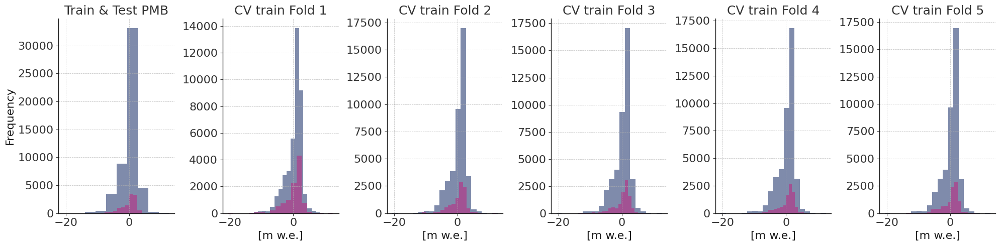

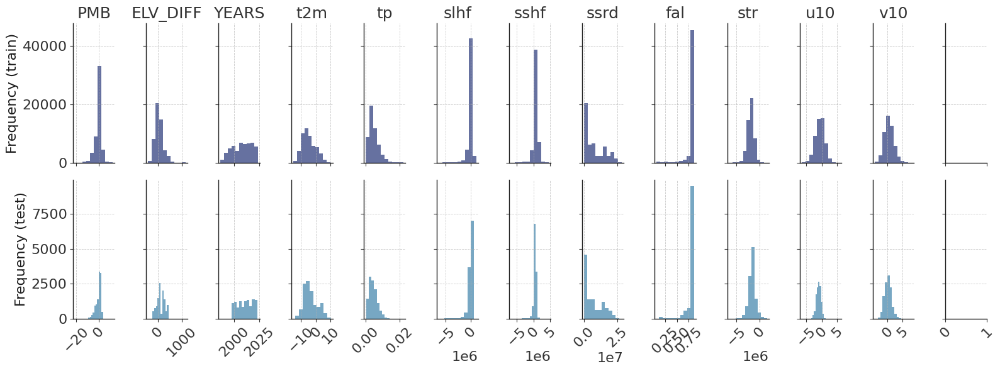

In [13]:
splits, test_set, train_set = get_CV_splits(dataloader_gl,
                                            test_split_on='GLACIER',
                                            test_splits=test_glaciers,
                                            random_state=cfg.seed)

print('Test glaciers: ({}) {}'.format(len(test_set['splits_vals']),
                                      test_set['splits_vals']))
test_perc = (len(test_set['df_X']) / len(train_set['df_X'])) * 100
print('Percentage of test size: {:.2f}%'.format(test_perc))
print('Size of test set:', len(test_set['df_X']))
print('Train glaciers: ({}) {}'.format(len(train_set['splits_vals']),
                                       train_set['splits_vals']))
print('Size of train set:', len(train_set['df_X']))

visualiseSplits(test_set['y'], train_set['y'], splits)
visualiseInputs(train_set, test_set, vois_climate)

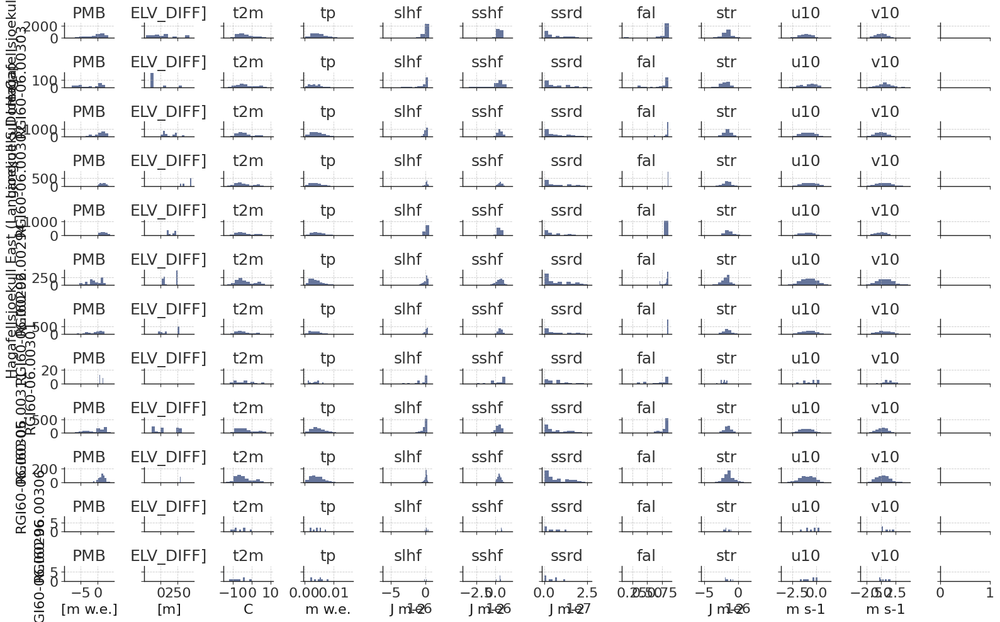

In [14]:
# plot distributions of test glaciers:
f, ax = plt.subplots(len(test_glaciers),
                     len(vois_climate) + 3,
                     figsize=(16, 10),
                     sharey='row',
                     sharex='col')

for i, test_gl in enumerate(test_glaciers):
    test_df_gl = test_set['df_X'][test_set['df_X'].GLACIER == test_gl]
    test_df_gl['POINT_BALANCE'].plot.hist(ax=ax[i, 0],
                                          color=color_dark_blue,
                                          alpha=0.6,
                                          density=False)
    ax[i, 0].set_title('PMB')
    ax[i, 0].set_ylabel(test_gl)
    ax[i, 0].set_xlabel('[m w.e.]')
    test_df_gl['ELEVATION_DIFFERENCE'].plot.hist(ax=ax[i, 1],
                                                 color=color_dark_blue,
                                                 alpha=0.6,
                                                 density=False)
    ax[i, 1].set_title('ELV_DIFF]')
    ax[i, 1].set_xlabel('[m]')

    for j, voi_clim in enumerate(vois_climate):
        ax[i, 2 + j].set_title(voi_clim)
        test_df_gl[voi_clim].plot.hist(ax=ax[i, 2 + j],
                                       color=color_dark_blue,
                                       alpha=0.6,
                                       density=False)
        ax[i, 2 + j].set_xlabel(vois_units[voi_clim])

plt.tight_layout()

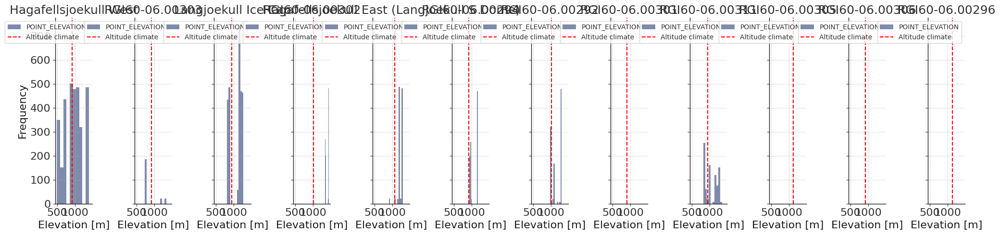

In [15]:
f, ax = plt.subplots(1,
                     len(test_glaciers),
                     figsize=(20, 5),
                     sharey='row',
                     sharex='row')

for i, test_gl in enumerate(test_glaciers):
    test_df_gl = test_set['df_X'][test_set['df_X'].GLACIER == test_gl]
    test_df_gl.POINT_ELEVATION.plot.hist(color=color_dark_blue,
                                         alpha=0.5,
                                         density=False,
                                         ax=ax[i])
    # add vertical line for altitude climate
    alt_climate = test_df_gl.ALTITUDE_CLIMATE.mean()
    ax[i].axvline(x=alt_climate,
                  color='red',
                  linestyle='--',
                  label='Altitude climate')
    ax[i].set_xlabel('Elevation [m]')
    ax[i].legend()
    ax[i].set_title(test_gl)
plt.tight_layout()

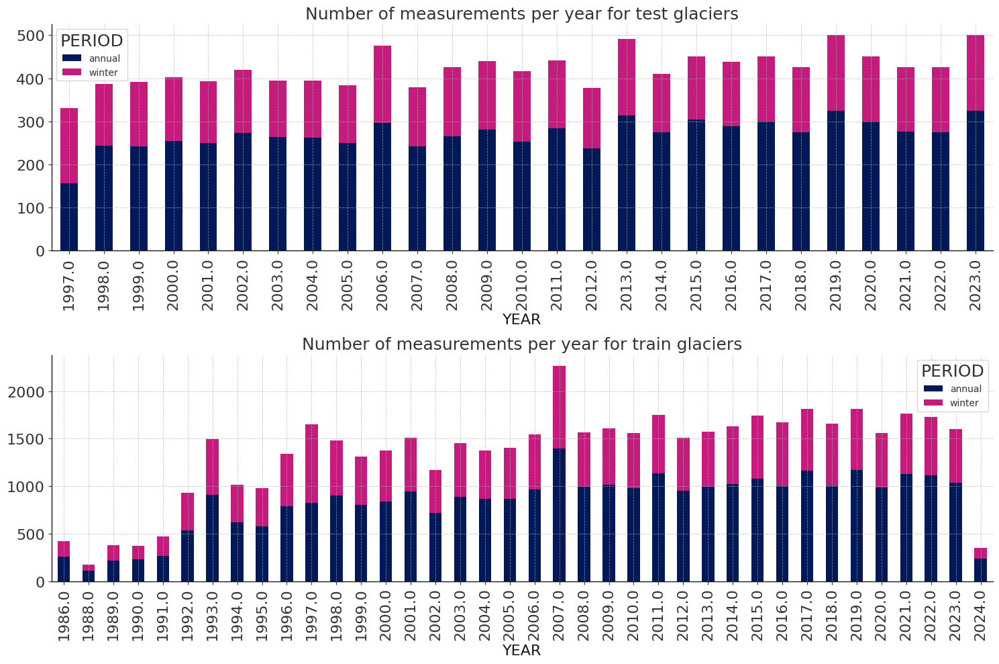

In [16]:
# Number of measurements per year:
fig, ax = plt.subplots(2, 1, figsize=(15, 10))
data_test.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar', stacked=True, color=[color_dark_blue, color_pink], ax=ax[0])
ax[0].set_title('Number of measurements per year for test glaciers')

# Number of measurements per year:
data_train.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar', stacked=True, color=[color_dark_blue, color_pink], ax=ax[1])
ax[1].set_title('Number of measurements per year for train glaciers')
plt.tight_layout()

## XGBoost:

In [17]:
# Grid search
# For each of the XGBoost parameter, define the grid range
param_grid = {
    'max_depth': [2, 3, 4, 5, 6, 7, 8],
    'n_estimators':
    [50, 100, 200, 300, 400, 500, 600,
     700],  # number of trees (too many = overfitting, too few = underfitting)
    'learning_rate': [0.01, 0.1, 0.15, 0.2, 0.25, 0.3]
}

param_init = {}
param_init['device'] = 'cuda:0'
param_init['tree_method'] = 'hist'
param_init["random_state"] = cfg.seed
param_init["n_jobs"] = cfg.numJobs

vois_climate = [
    't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10'
]

vois_topographical = [
    "aspect",
    "slope",
    #"hugonnet_dhdt",
    "consensus_ice_thickness",
    "millan_v",
]

### Grid search:

In [ ]:
%%time
# Feature columns:
feature_columns = [
    'ELEVATION_DIFFERENCE'
] + list(vois_climate) + list(vois_topographical)
all_columns = feature_columns + cfg.fieldsNotFeatures
df_X_train_subset = train_set['df_X'][all_columns]
print('Shape of training dataset:', df_X_train_subset.shape)
print('Shape of testing dataset:', test_set['df_X'][all_columns].shape)
print('Running with features:', feature_columns)

RUN = False
if RUN:
    # Create a CustomXGBoostRegressor instance
    custom_xgboost = mbm.models.CustomXGBoostRegressor(cfg, **param_init)
    custom_xgboost.randomsearch(
        parameters=param_grid,
        n_iter=45,
        splits=splits,
        features=df_X_train_subset,
        targets=train_set['y'],
    )

    # save best model
    custom_xgboost.save_model(f'xgb_Iceland.pkl')
else:
    # read model
    custom_xgboost = mbm.models.CustomXGBoostRegressor(cfg)
    custom_xgboost.load_model(
        f'xgb_Iceland.pkl')

# Get best parameters and estimator
best_params = custom_xgboost.param_search.best_params_
best_estimator = custom_xgboost.param_search.best_estimator_
print("Best parameters:\n", best_params)
print("Best score:\n", custom_xgboost.param_search.best_score_)

# Make predictions on test:
# Set to CPU for predictions:
best_estimator_cpu = best_estimator.set_params(device='cpu')

# Make predictions on test
features_test, metadata_test = best_estimator_cpu._create_features_metadata(
    test_set['df_X'][all_columns])
y_pred = best_estimator_cpu.predict(features_test)
print('Shape of the test:', features_test.shape)

# Make predictions aggr to meas ID:
y_pred_agg = best_estimator_cpu.aggrPredict(metadata_test, features_test)

# Calculate scores
score = best_estimator_cpu.score(test_set['df_X'][all_columns],
                                 test_set['y'])  # negative
print('Overall score:', np.abs(score))

Shape of training dataset: (51008, 25)
Shape of testing dataset: (11417, 25)
Running with features: ['ELEVATION_DIFFERENCE', 't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10', 'aspect', 'slope', 'consensus_ice_thickness', 'millan_v']
Best parameters:
 {'n_estimators': 500, 'max_depth': 8, 'learning_rate': 0.01}
Best score:
 -0.6136214059281291
Shape of the test: (11417, 14)
Overall score: 1.1123751444467647
CPU times: user 2.5 s, sys: 108 ms, total: 2.61 s
Wall time: 142 ms


In [ ]:
# visualiseValPreds(best_estimator, splits, train_set, feature_columns)

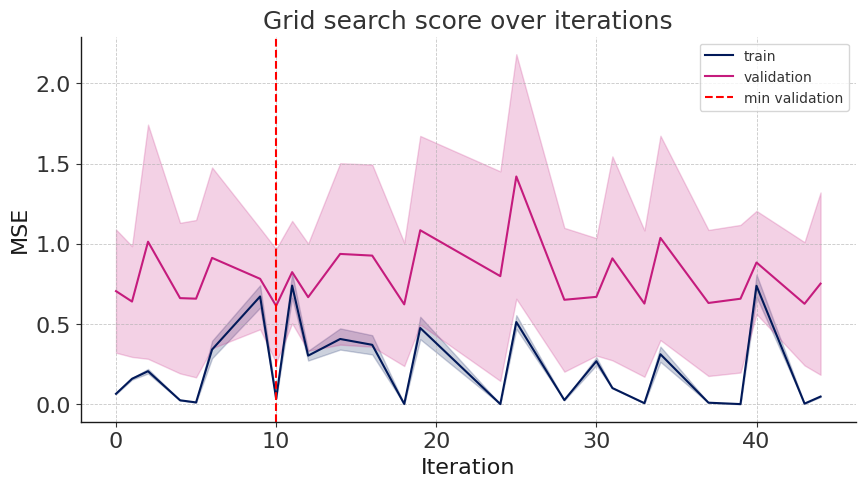

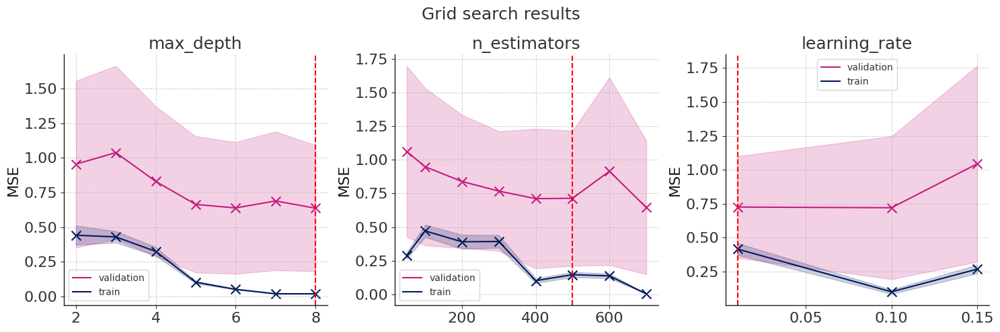

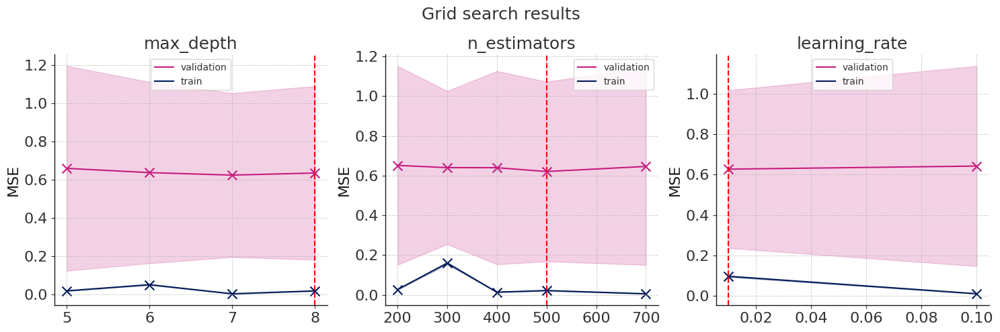

In [19]:
plotGridSearchScore(cv_results_=custom_xgboost.param_search.cv_results_,
                    lossType=cfg.loss)
plotGridSearchParams(custom_xgboost.param_search.cv_results_,
                     param_grid,
                     lossType=cfg.loss)
plotGridSearchParams(custom_xgboost.param_search.cv_results_,
                     param_grid,
                     lossType=cfg.loss,
                     N=10)

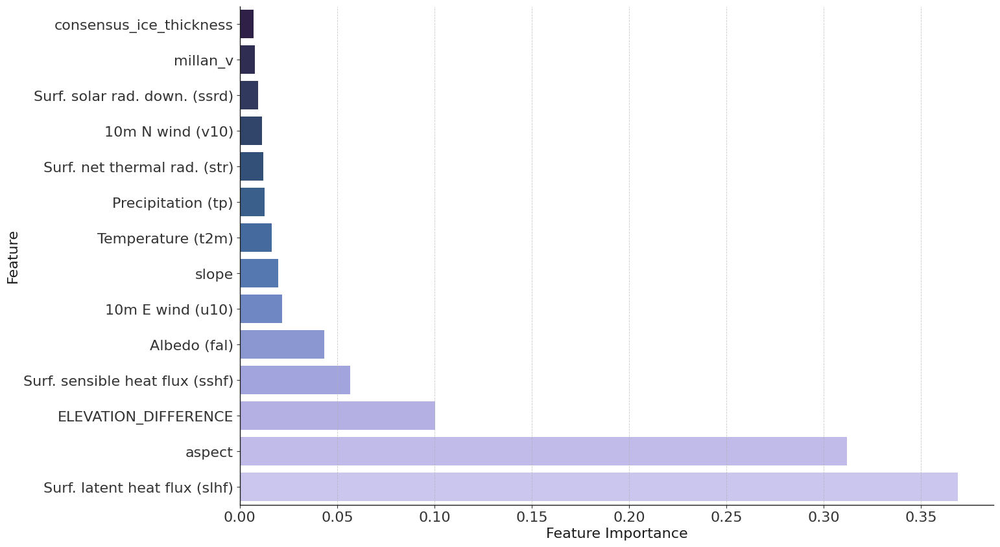

In [20]:
FIPlot(best_estimator, feature_columns, vois_climate)

#### Predictions of best parameters:

Shape of the test: (11417, 14)
{'Hagafellsjoekull West': '#a6cee3', 'RGI60-06.00303': '#1f78b4', 'Langjoekull Ice Cap': '#b2df8a', 'RGI60-06.00302': '#33a02c', 'Hagafellsjoekull East (Langjoekull S Dome)': '#fb9a99', 'RGI60-06.00294': '#e31a1c', 'RGI60-06.00292': '#fdbf6f', 'RGI60-06.00301': '#ff7f00', 'RGI60-06.00311': '#cab2d6', 'RGI60-06.00305': '#6a3d9a', 'RGI60-06.00306': '#ffff99', 'RGI60-06.00296': '#b15928'}


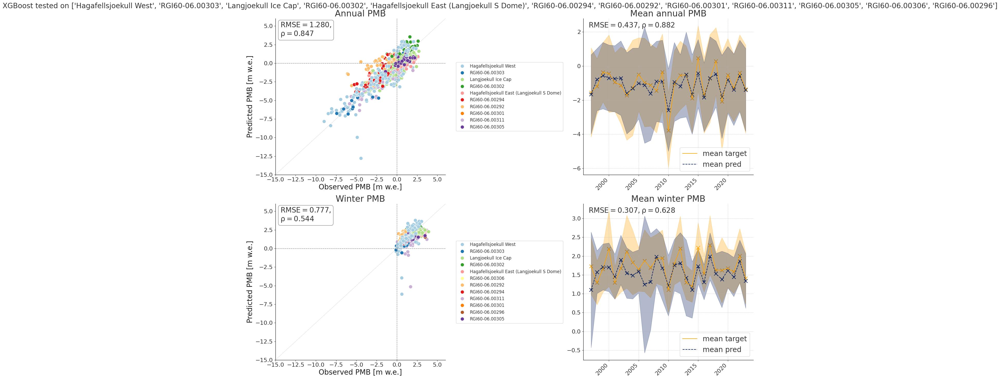

In [21]:
# Make predictions on test:
# Set to CPU for predictions:
best_estimator_cpu = best_estimator.set_params(device='cpu')

features_test, metadata_test = best_estimator_cpu._create_features_metadata(
    test_set['df_X'][all_columns])
y_pred = best_estimator_cpu.predict(features_test)
print('Shape of the test:', features_test.shape)

y_pred_agg = best_estimator_cpu.aggrPredict(metadata_test, features_test)
grouped_ids = getDfAggregatePred(test_set, y_pred_agg, all_columns)
PlotPredictions(grouped_ids, y_pred, metadata_test, test_set,
                best_estimator_cpu)
plt.suptitle(f'XGBoost tested on {test_glaciers}', fontsize=20)
plt.tight_layout()

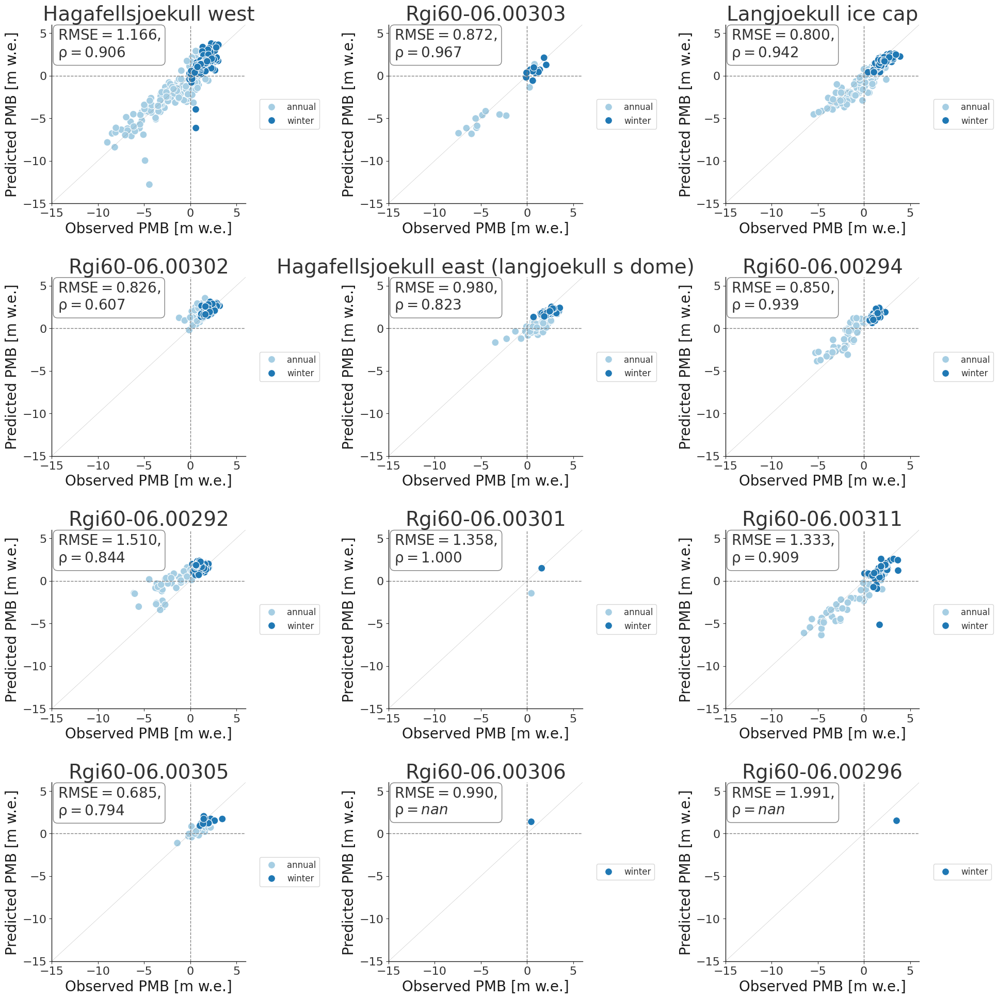

In [22]:
PlotIndividualGlacierPredVsTruth(grouped_ids, base_figsize=(20, 15))

###### Analyzing problematic predictions in Hagafellsjoekull West

In [85]:
grouped_ids_test = grouped_ids.copy()
grouped_ids_test['pmb_diff'] = grouped_ids_test['target'] - grouped_ids_test['pred']
display(grouped_ids_test[
    (grouped_ids_test['GLACIER'] == 'Hagafellsjoekull West') & 
    (abs(grouped_ids_test['pmb_diff']) > 4)
])
display(grouped_ids_test[grouped_ids_test['POINT_ID'] == 'Hagafellsjoekull West_2005.0_annual_L02'])
display(grouped_ids_test[grouped_ids_test['POINT_ID'] == 'Hagafellsjoekull West_2008.0_annual_L02'])


display(data_monthly[data_monthly['POINT_ID'] == 'Hagafellsjoekull West_2005.0_annual_L02'])
display(data_monthly[data_monthly['POINT_ID'] == 'Hagafellsjoekull West_2006.0_annual_L02'])
display(data_monthly[data_monthly['POINT_ID'] == 'Hagafellsjoekull West_2007.0_annual_L02'])
display(data_monthly[data_monthly['POINT_ID'] == 'Hagafellsjoekull West_2008.0_annual_L02'])

,target,YEAR,POINT_ID,pred,PERIOD,GLACIER,pmb_diff
ID,,,,,,,
2768,-4.4255,2006.0,Hagafellsjoekull West_2006.0_annual_L02,-12.797798,annual,Hagafellsjoekull West,8.372298
2769,-4.8910,2007.0,Hagafellsjoekull West_2007.0_annual_L02,-9.976252,annual,Hagafellsjoekull West,5.085252
6132,0.6220,2006.0,Hagafellsjoekull West_2006.0_winter_L02,-6.152007,winter,Hagafellsjoekull West,6.774007
6133,0.6095,2007.0,Hagafellsjoekull West_2007.0_winter_L02,-3.963931,winter,Hagafellsjoekull West,4.573431


,target,YEAR,POINT_ID,pred,PERIOD,GLACIER,pmb_diff
ID,,,,,,,
2767,-3.455,2005.0,Hagafellsjoekull West_2005.0_annual_L02,-4.042272,annual,Hagafellsjoekull West,0.587272


,target,YEAR,POINT_ID,pred,PERIOD,GLACIER,pmb_diff
ID,,,,,,,
2770,-4.8685,2008.0,Hagafellsjoekull West_2008.0_annual_L02,-4.144308,annual,Hagafellsjoekull West,-0.724192


,YEAR,POINT_LON,POINT_LAT,POINT_BALANCE,ALTITUDE_CLIMATE,ELEVATION_DIFFERENCE,POINT_ELEVATION,RGIId,POINT_ID,ID,...,millan_v,t2m,tp,slhf,sshf,ssrd,fal,str,u10,v10
33527,2005.0,-20.44524,64.51884,-3.455,697.604104,-18.604104,679.0,RGI60-06.00291,Hagafellsjoekull West_2005.0_annual_L02,2767,...,14.780278,-5.740082,0.008945,171860.0,619376.0,835676.0,0.786766,-1113670.0,-0.808016,-0.193305
33528,2005.0,-20.44524,64.51884,-3.455,697.604104,-18.604104,679.0,RGI60-06.00291,Hagafellsjoekull West_2005.0_annual_L02,2767,...,14.780278,-8.268890,0.009208,286750.0,885002.0,169680.0,0.849603,-1672406.0,-0.231770,0.619059
33529,2005.0,-20.44524,64.51884,-3.455,697.604104,-18.604104,679.0,RGI60-06.00291,Hagafellsjoekull West_2005.0_annual_L02,2767,...,14.780278,-7.438080,0.006489,251984.0,716154.0,491032.0,0.831851,-1183814.0,-0.201732,0.348948
33530,2005.0,-20.44524,64.51884,-3.455,697.604104,-18.604104,679.0,RGI60-06.00291,Hagafellsjoekull West_2005.0_annual_L02,2767,...,14.780278,-5.287842,0.006962,83732.0,423746.0,2735446.0,0.817500,-1787232.0,0.219162,0.492053
33531,2005.0,-20.44524,64.51884,-3.455,697.604104,-18.604104,679.0,RGI60-06.00291,Hagafellsjoekull West_2005.0_annual_L02,2767,...,14.780278,-3.139252,0.003691,21204.0,654418.0,6601222.0,0.727758,-2018930.0,-1.223180,-0.236934
33532,2005.0,-20.44524,64.51884,-3.455,697.604104,-18.604104,679.0,RGI60-06.00291,Hagafellsjoekull West_2005.0_annual_L02,2767,...,14.780278,-1.567963,0.003656,-476140.0,613030.0,13206492.0,0.730656,-2695413.0,-1.715254,-0.287315
33533,2005.0,-20.44524,64.51884,-3.455,697.604104,-18.604104,679.0,RGI60-06.00291,Hagafellsjoekull West_2005.0_annual_L02,2767,...,14.780278,0.471344,0.001678,-1462400.0,251868.0,19928904.0,0.604284,-4017570.0,0.171519,-0.926011
33534,2005.0,-20.44524,64.51884,-3.455,697.604104,-18.604104,679.0,RGI60-06.00291,Hagafellsjoekull West_2005.0_annual_L02,2767,...,14.780278,5.770416,0.004326,-1443168.0,-387534.0,16723112.0,0.391756,-1982611.0,-0.114795,-0.126993
33535,2005.0,-20.44524,64.51884,-3.455,697.604104,-18.604104,679.0,RGI60-06.00291,Hagafellsjoekull West_2005.0_annual_L02,2767,...,14.780278,9.018463,0.004316,-5015682.0,-3195420.0,15298186.0,0.133768,-4042268.0,-0.082582,0.588805
33536,2005.0,-20.44524,64.51884,-3.455,697.604104,-18.604104,679.0,RGI60-06.00291,Hagafellsjoekull West_2005.0_annual_L02,2767,...,14.780278,6.044586,0.005242,-3343000.0,-2147238.0,10293940.0,0.144014,-3168314.0,-1.058862,-0.319183


,YEAR,POINT_LON,POINT_LAT,POINT_BALANCE,ALTITUDE_CLIMATE,ELEVATION_DIFFERENCE,POINT_ELEVATION,RGIId,POINT_ID,ID,...,millan_v,t2m,tp,slhf,sshf,ssrd,fal,str,u10,v10
33538,2006.0,-20.44556,64.5186,-4.4255,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2006.0_annual_L02,2768,...,11.960814,-3.300629,0.005432,89310.0,808426.0,3214275.0,0.729689,-1605384.0,-1.386183,-1.478721
33539,2006.0,-20.44556,64.5186,-4.4255,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2006.0_annual_L02,2768,...,11.960814,-5.048431,0.005781,152576.0,634150.0,781776.0,0.836494,-1247500.0,-0.975334,-0.329053
33540,2006.0,-20.44556,64.5186,-4.4255,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2006.0_annual_L02,2768,...,11.960814,-4.566986,0.010001,291432.0,657030.0,164760.0,0.838906,-1306820.0,-0.817451,0.822795
33541,2006.0,-20.44556,64.5186,-4.4255,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2006.0_annual_L02,2768,...,11.960814,-4.819183,0.012181,290032.0,609192.0,468720.0,0.840671,-1090987.0,-0.927302,2.034252
33542,2006.0,-20.44556,64.5186,-4.4255,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2006.0_annual_L02,2768,...,11.960814,-2.829681,0.007167,228858.0,634816.0,2434388.0,0.752681,-1822114.0,-1.489217,0.106059
33543,2006.0,-20.44556,64.5186,-4.4255,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2006.0_annual_L02,2768,...,11.960814,-6.211273,0.002011,-226712.0,463376.0,8027673.0,0.727819,-2971556.0,-1.716355,-1.598145
33544,2006.0,-20.44556,64.5186,-4.4255,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2006.0_annual_L02,2768,...,11.960814,-4.355804,0.005899,-102282.0,384646.0,15651574.0,0.831683,-2900387.0,0.173058,-0.362378
33545,2006.0,-20.44556,64.5186,-4.4255,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2006.0_annual_L02,2768,...,11.960814,0.746002,0.002532,-1139856.0,195520.0,19259040.0,0.612456,-3590081.0,-1.286585,-1.333847
33546,2006.0,-20.44556,64.5186,-4.4255,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2006.0_annual_L02,2768,...,11.960814,4.151764,0.006869,85780.0,827226.0,14091856.0,0.540285,-794972.0,-0.440916,1.273792
33547,2006.0,-20.44556,64.5186,-4.4255,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2006.0_annual_L02,2768,...,11.960814,7.275055,0.004562,-3053908.0,-1564826.0,12624524.0,0.206095,-2646669.0,-0.518430,0.426090


,YEAR,POINT_LON,POINT_LAT,POINT_BALANCE,ALTITUDE_CLIMATE,ELEVATION_DIFFERENCE,POINT_ELEVATION,RGIId,POINT_ID,ID,...,millan_v,t2m,tp,slhf,sshf,ssrd,fal,str,u10,v10
33551,2007.0,-20.44537,64.51887,-4.891,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2007.0_annual_L02,2769,...,14.780278,-7.198090,0.007058,35688.0,1124108.0,997284.0,0.795310,-1696648.0,-1.651969,-1.313510
33552,2007.0,-20.44537,64.51887,-4.891,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2007.0_annual_L02,2769,...,14.780278,-4.638031,0.010460,358266.0,807708.0,160984.0,0.794976,-1241260.0,-1.077040,0.742627
33553,2007.0,-20.44537,64.51887,-4.891,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2007.0_annual_L02,2769,...,14.780278,-8.623627,0.004179,224778.0,738372.0,475620.0,0.805713,-1535988.0,-0.389222,-0.632123
33554,2007.0,-20.44537,64.51887,-4.891,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2007.0_annual_L02,2769,...,14.780278,-7.766693,0.003633,171392.0,1045868.0,3003758.0,0.806468,-2779250.0,-1.955219,-0.883820
33555,2007.0,-20.44537,64.51887,-4.891,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2007.0_annual_L02,2769,...,14.780278,-4.264008,0.009681,161542.0,680278.0,6906958.0,0.838537,-1843356.0,-0.901656,1.195910
33556,2007.0,-20.44537,64.51887,-4.891,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2007.0_annual_L02,2769,...,14.780278,-0.790375,0.006796,-295526.0,219458.0,12622800.0,0.729541,-2215456.0,-1.047737,0.943120
33557,2007.0,-20.44537,64.51887,-4.891,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2007.0_annual_L02,2769,...,14.780278,0.140289,0.002051,-1208574.0,304592.0,19812520.0,0.630099,-3866738.0,-1.020650,-0.892584
33558,2007.0,-20.44537,64.51887,-4.891,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2007.0_annual_L02,2769,...,14.780278,6.091217,0.001778,-1297328.0,462728.0,17557752.0,0.460527,-1790700.0,-0.732829,0.127923
33559,2007.0,-20.44537,64.51887,-4.891,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2007.0_annual_L02,2769,...,14.780278,9.790924,0.002831,-5503624.0,-3178348.0,16997060.0,0.133799,-5033435.0,-0.272125,-0.394845
33560,2007.0,-20.44537,64.51887,-4.891,697.604104,-21.604104,676.0,RGI60-06.00291,Hagafellsjoekull West_2007.0_annual_L02,2769,...,14.780278,6.421783,0.004848,-3392090.0,-2305338.0,11107394.0,0.134676,-3537918.0,-0.435301,-0.580100


,YEAR,POINT_LON,POINT_LAT,POINT_BALANCE,ALTITUDE_CLIMATE,ELEVATION_DIFFERENCE,POINT_ELEVATION,RGIId,POINT_ID,ID,...,millan_v,t2m,tp,slhf,sshf,ssrd,fal,str,u10,v10
33562,2008.0,-20.4452,64.51885,-4.8685,697.604104,-28.604104,669.0,RGI60-06.00291,Hagafellsjoekull West_2008.0_annual_L02,2770,...,14.780278,0.201569,0.015851,-213106.0,236252.0,2647273.0,0.391020,-1532600.0,-1.179562,1.415508
33563,2008.0,-20.4452,64.51885,-4.8685,697.604104,-28.604104,669.0,RGI60-06.00291,Hagafellsjoekull West_2008.0_annual_L02,2770,...,14.780278,-4.328949,0.007859,43644.0,684586.0,869260.0,0.791435,-1386556.0,-0.736665,-0.159671
33564,2008.0,-20.4452,64.51885,-4.8685,697.604104,-28.604104,669.0,RGI60-06.00291,Hagafellsjoekull West_2008.0_annual_L02,2770,...,14.780278,-6.082611,0.011318,383882.0,1118458.0,181560.0,0.822518,-1823444.0,-1.936496,1.265792
33565,2008.0,-20.4452,64.51885,-4.8685,697.604104,-28.604104,669.0,RGI60-06.00291,Hagafellsjoekull West_2008.0_annual_L02,2770,...,14.780278,-7.583832,0.006473,201942.0,918104.0,539488.0,0.824725,-2011715.0,-1.538512,0.545691
33566,2008.0,-20.4452,64.51885,-4.8685,697.604104,-28.604104,669.0,RGI60-06.00291,Hagafellsjoekull West_2008.0_annual_L02,2770,...,14.780278,-6.541107,0.008607,183180.0,920114.0,2529812.0,0.834595,-1864014.0,-0.417540,1.176327
33567,2008.0,-20.4452,64.51885,-4.8685,697.604104,-28.604104,669.0,RGI60-06.00291,Hagafellsjoekull West_2008.0_annual_L02,2770,...,14.780278,-5.336517,0.003911,4794.0,636324.0,7836477.0,0.846124,-2305620.0,-1.127824,-1.126515
33568,2008.0,-20.4452,64.51885,-4.8685,697.604104,-28.604104,669.0,RGI60-06.00291,Hagafellsjoekull West_2008.0_annual_L02,2770,...,14.780278,-3.450043,0.001675,-290654.0,418153.0,15874490.0,0.788989,-3355708.0,-1.784403,-1.473724
33569,2008.0,-20.4452,64.51885,-4.8685,697.604104,-28.604104,669.0,RGI60-06.00291,Hagafellsjoekull West_2008.0_annual_L02,2770,...,14.780278,2.588043,0.002520,-231146.0,404616.0,13994984.0,0.561270,-1173179.0,-1.304642,0.310011
33570,2008.0,-20.4452,64.51885,-4.8685,697.604104,-28.604104,669.0,RGI60-06.00291,Hagafellsjoekull West_2008.0_annual_L02,2770,...,14.780278,5.195953,0.002351,-1889238.0,-74568.0,21168250.0,0.427538,-3477864.0,-1.457090,-0.910849
33571,2008.0,-20.4452,64.51885,-4.8685,697.604104,-28.604104,669.0,RGI60-06.00291,Hagafellsjoekull West_2008.0_annual_L02,2770,...,14.780278,9.796051,0.003057,-5689670.0,-2727472.0,16306892.0,0.133783,-4572174.0,-1.171265,0.087609


Available years: [2005, 2006, 2007, 2008]


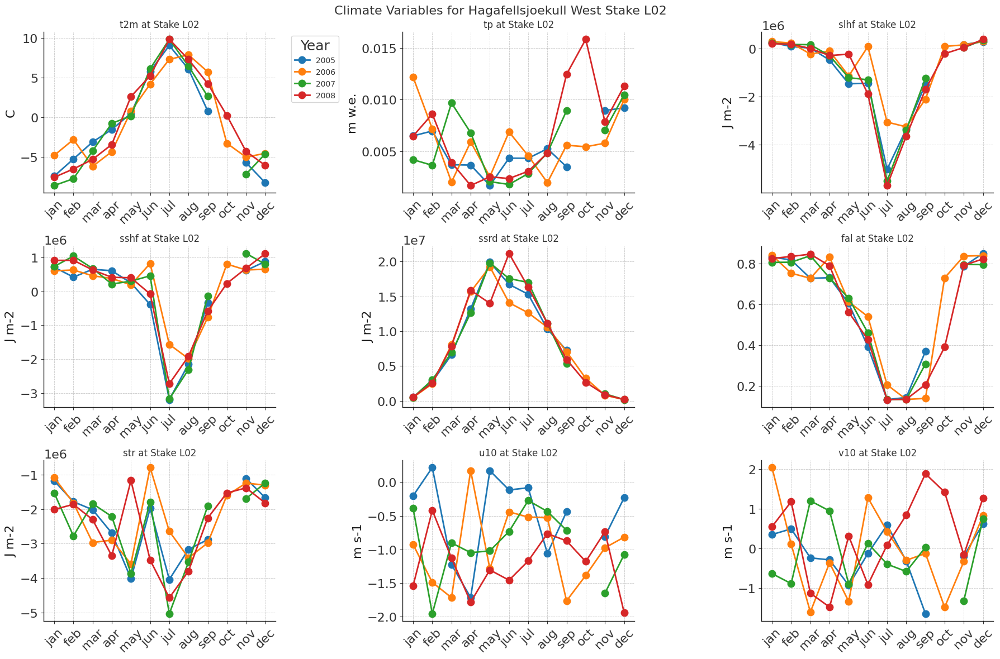

In [ ]:
## Plot climate variables for Hagafellsjoekull West Stake L02 nonproblematic year 2005 and 2008 and problematic year 2006 and 2007
stake_l02_data = data_monthly[data_monthly['POINT_ID'].str.contains('Hagafellsjoekull West_.+_annual_L02')]

plt.figure(figsize=(18, 12))

years_to_compare = [2005, 2006, 2007, 2008]
print(f"Available years: {years_to_compare}")

month_order = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']

# Plot each climate variable
for var_idx, var in enumerate(vois_climate):
    ax = plt.subplot(3, 3, var_idx+1)
    
    # Group by year and month, taking mean if multiple values exist
    pivot_data = stake_l02_data.pivot_table(
        index='MONTHS', columns='YEAR', values=var, aggfunc='mean')
    
    for year in years_to_compare:
        if year in pivot_data.columns:
            # Get x and y values in correct month order
            valid_months = [m for m in month_order if m in pivot_data.index]
            x_pos = [month_order.index(m) for m in valid_months]
            y_vals = [pivot_data.loc[m, year] for m in valid_months]
            
            ax.plot(x_pos, y_vals, marker='o', linewidth=2, label=f'{int(year)}')
    
    ax.set_title(f'{var} at Stake L02', fontsize=12)
    ax.set_ylabel(vois_units.get(var, ''))
    ax.set_xticks(range(len(month_order)))
    ax.set_xticklabels(month_order, rotation=45)
    ax.grid(True, linestyle='--', alpha=0.7)
    
    # Add legend only to the first plot
    if var_idx == 0:
        ax.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.suptitle('Climate Variables for Hagafellsjoekull West Stake L02', fontsize=16)
plt.tight_layout()
plt.show()

#### Train CH Test ICE

###### Load CH glaciers and merge with ICE

In [ ]:
data_CH = pd.read_csv('/home/mburlet/scratch/data/GLAMOS/point/csv/CH_wgms_dataset_all.csv')
data_ICE = pd.read_csv('/home/mburlet/scratch/data/DATA_MB/WGMS/Iceland/csv/ICE_dataset_all_oggm.csv')

display(data_CH.columns)

display(data_ICE.columns)

data_CH = data_CH.drop(['hugonnet_dhdt', 'aspect_sgi', 'slope_sgi', 'topo_sgi'], axis=1)

display(data_CH.columns)

# Merge CH with ICE
data_ICE_CH = pd.concat([data_ICE, data_CH], axis=0).reset_index(drop=True)

display(data_ICE_CH.head(2))

display(len(data_ICE_CH['GLACIER'].unique()))

,POINT_ELEVATION,POINT_LAT,POINT_LON,FROM_DATE,TO_DATE,POINT_BALANCE,PERIOD,YEAR,RGIId,aspect,slope,topo,consensus_ice_thickness,millan_v,GLACIER,POINT_ID
0,1049.600000,64.790063,-18.595688,19880920,19890922,0.45,annual,1989.0,RGI60-06.00234,158.071560,2.508572,1034.505493,270.877716,25.446609,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_1989.0_annual_...
1,1049.400000,64.790063,-18.595688,19890922,19900916,-0.80,annual,1990.0,RGI60-06.00234,158.071560,2.508572,1034.505493,270.877716,25.446609,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_1990.0_annual_...
2,1049.100000,64.790063,-18.595688,19900916,19910912,-2.37,annual,1991.0,RGI60-06.00234,158.071560,2.508572,1034.505493,270.877716,25.446609,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_1991.0_annual_...
3,1048.900000,64.790063,-18.595688,19910912,19920920,0.65,annual,1992.0,RGI60-06.00234,158.071560,2.508572,1034.505493,270.877716,25.446609,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_1992.0_annual_...
4,1048.600000,64.790063,-18.595688,19920920,19930917,-0.06,annual,1993.0,RGI60-06.00234,158.071560,2.508572,1034.505493,270.877716,25.446609,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_1993.0_annual_...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6581,1697.000000,64.793858,-18.843883,20191106,20200429,2.04,winter,2020.0,RGI60-06.00234,129.234952,3.695461,1692.968628,320.101654,48.503876,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_2020.0_winter_...
6582,1697.000000,64.793858,-18.843883,20201010,20210503,1.93,winter,2021.0,RGI60-06.00234,129.234952,3.695461,1692.968628,320.101654,48.503876,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_2021.0_winter_...
6583,1697.000000,64.793858,-18.843883,20211021,20220427,2.74,winter,2022.0,RGI60-06.00234,129.234952,3.695461,1692.968628,320.101654,48.503876,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_2022.0_winter_...
6584,1697.000000,64.793858,-18.843883,20221018,20230426,1.97,winter,2023.0,RGI60-06.00234,129.234952,3.695461,1692.968628,320.101654,48.503876,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_2023.0_winter_...


Index(['YEAR', 'POINT_ID', 'GLACIER', 'FROM_DATE', 'TO_DATE', 'POINT_LAT',
       'POINT_LON', 'POINT_ELEVATION', 'POINT_BALANCE', 'PERIOD', 'RGIId',
       'aspect', 'slope', 'topo', 'hugonnet_dhdt', 'consensus_ice_thickness',
       'millan_v', 'aspect_sgi', 'slope_sgi', 'topo_sgi'],
      dtype='object')

Index(['POINT_ELEVATION', 'POINT_LAT', 'POINT_LON', 'FROM_DATE', 'TO_DATE',
       'POINT_BALANCE', 'PERIOD', 'YEAR', 'RGIId', 'aspect', 'slope', 'topo',
       'consensus_ice_thickness', 'millan_v', 'GLACIER', 'POINT_ID'],
      dtype='object')

Index(['YEAR', 'POINT_ID', 'GLACIER', 'FROM_DATE', 'TO_DATE', 'POINT_LAT',
       'POINT_LON', 'POINT_ELEVATION', 'POINT_BALANCE', 'PERIOD', 'RGIId',
       'aspect', 'slope', 'topo', 'consensus_ice_thickness', 'millan_v'],
      dtype='object')

,POINT_ELEVATION,POINT_LAT,POINT_LON,FROM_DATE,TO_DATE,POINT_BALANCE,PERIOD,YEAR,RGIId,aspect,slope,topo,consensus_ice_thickness,millan_v,GLACIER,POINT_ID
0,1049.6,64.790063,-18.595688,19880920,19890922,0.45,annual,1989.0,RGI60-06.00234,158.07156,2.508572,1034.505493,270.877716,25.446609,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_1989.0_annual_...
1,1049.4,64.790063,-18.595688,19890922,19900916,-0.80,annual,1990.0,RGI60-06.00234,158.07156,2.508572,1034.505493,270.877716,25.446609,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_1990.0_annual_...


88

###### Add ERA5Land data to the combined CH_ICE stakes

In [89]:
data_CH_ICE_test = data_ICE_CH.copy()

display(data_CH_ICE_test.shape)
display(data_CH_ICE_test.head(2))

# Initialize logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(message)s')

# Transform data to monthly format (run or load data):
paths = {
    'csv_path': path_PMB_WGMS_csv,
    'era5_climate_data': path_ERA5_raw + 'era5_monthly_averaged_data.nc',
    'geopotential_data': path_ERA5_raw + 'era5_geopotential_pressure.nc'
    #'radiation_save_path': path_pcsr + 'zarr/'
}

RUN = False
dataloader_gl = process_or_load_data(run_flag=RUN,
                                     df=data_CH_ICE_test,
                                     paths=paths,
                                     cfg=cfg,
                                     vois_climate=vois_climate,
                                     vois_topographical=vois_topographical,
                                     output_file= 'CH_ICE_wgms_dataset_monthly_full.csv')
data_monthly_CH_ICE = dataloader_gl.data

display(data_monthly_CH_ICE.head(2))

(39944, 16)

,POINT_ELEVATION,POINT_LAT,POINT_LON,FROM_DATE,TO_DATE,POINT_BALANCE,PERIOD,YEAR,RGIId,aspect,slope,topo,consensus_ice_thickness,millan_v,GLACIER,POINT_ID
0,1049.6,64.790063,-18.595688,19880920,19890922,0.45,annual,1989.0,RGI60-06.00234,158.07156,2.508572,1034.505493,270.877716,25.446609,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_1989.0_annual_...
1,1049.4,64.790063,-18.595688,19890922,19900916,-0.80,annual,1990.0,RGI60-06.00234,158.07156,2.508572,1034.505493,270.877716,25.446609,Thjorsarjoekull (Hofsjoekull E),Thjorsarjoekull (Hofsjoekull E)_1990.0_annual_...


2025-05-28 08:17:40,969 - INFO - Loaded preprocessed data.
2025-05-28 08:17:40,970 - INFO - Number of monthly rows: 353107
2025-05-28 08:17:40,999 - INFO - Number of annual rows: 126266
2025-05-28 08:17:41,035 - INFO - Number of winter rows: 226841


,YEAR,POINT_LON,POINT_LAT,POINT_BALANCE,ALTITUDE_CLIMATE,ELEVATION_DIFFERENCE,POINT_ELEVATION,RGIId,POINT_ID,ID,...,millan_v,t2m,tp,slhf,sshf,ssrd,fal,str,u10,v10
0,1989.0,-18.595688,64.790063,0.45,1094.738918,-45.138918,1049.6,RGI60-06.00234,Thjorsarjoekull (Hofsjoekull E)_1989.0_annual_...,0,...,25.446609,-4.787933,0.003747,198886.0,590722.0,3990646.0,0.84564,-1779436.0,-0.590102,0.603381
1,1989.0,-18.595688,64.790063,0.45,1094.738918,-45.138918,1049.6,RGI60-06.00234,Thjorsarjoekull (Hofsjoekull E)_1989.0_annual_...,0,...,25.446609,-5.262054,0.003766,306376.0,576896.0,883468.0,0.84690,-1458576.0,0.129348,2.214950


###### Test and Train set

In [90]:
test_glaciers = list(data_ICE['GLACIER'].unique())

# Ensure all test glaciers exist in the dataset
existing_glaciers = set(dataloader_gl.data.GLACIER.unique())
missing_glaciers = [g for g in test_glaciers if g not in existing_glaciers]

if missing_glaciers:
    print(
        f"Warning: The following test glaciers are not in the dataset: {missing_glaciers}"
    )

# Define training glaciers correctly
#train_glaciers = list(data_CH['GLACIER'].unique())
train_glaciers = [i for i in existing_glaciers if i not in test_glaciers]

data_test = dataloader_gl.data[dataloader_gl.data.GLACIER.isin(test_glaciers)]
print('Size of test data:', len(data_test))

data_train = dataloader_gl.data[dataloader_gl.data.GLACIER.isin(
    train_glaciers)]
print('Size of train data:', len(data_train))

if len(data_train) == 0:
    print("Warning: No training data available!")
else:
    test_perc = (len(data_test) / len(data_train)) * 100
    print('Percentage of test size: {:.2f}%'.format(test_perc))

# Number of annual versus winter measurements:
print('Train:')
print('Number of winter and annual samples:', len(data_train))
print('Number of annual samples:',
      len(data_train[data_train.PERIOD == 'annual']))
print('Number of winter samples:',
      len(data_train[data_train.PERIOD == 'winter']))

# Same for test
data_test_annual = data_test[data_test.PERIOD == 'annual']
data_test_winter = data_test[data_test.PERIOD == 'winter']

print('Test:')
print('Number of winter and annual samples:', len(data_test))
print('Number of annual samples:', len(data_test_annual))
print('Number of winter samples:', len(data_test_winter))

print('Total:')
print('Number of monthly rows:', len(dataloader_gl.data))
print('Number of annual rows:',
      len(dataloader_gl.data[dataloader_gl.data.PERIOD == 'annual']))
print('Number of winter rows:',
      len(dataloader_gl.data[dataloader_gl.data.PERIOD == 'winter']))

Size of test data: 62425
Size of train data: 290682
Percentage of test size: 21.48%
Train:
Number of winter and annual samples: 290682
Number of annual samples: 87440
Number of winter samples: 203242
Test:
Number of winter and annual samples: 62425
Number of annual samples: 38826
Number of winter samples: 23599
Total:
Number of monthly rows: 353107
Number of annual rows: 126266
Number of winter rows: 226841


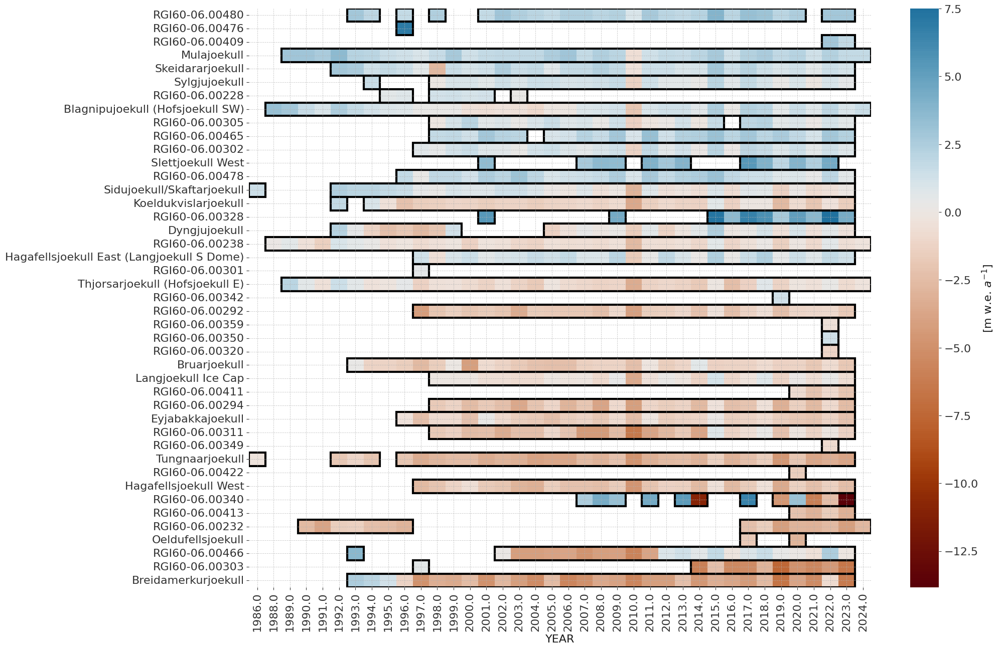

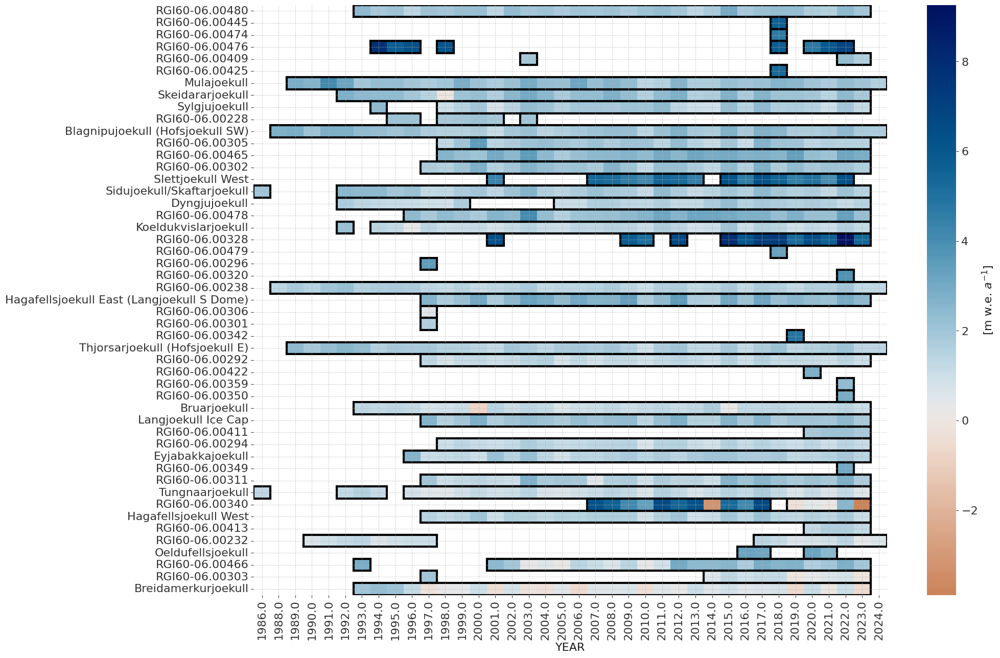

In [91]:
plotHeatmap(test_glaciers, data_monthly, period='annual')

plotHeatmap(test_glaciers, data_monthly, period='winter')

Test glaciers: (49) ['Thjorsarjoekull (Hofsjoekull E)' 'Sidujoekull/Skaftarjoekull'
 'Breidamerkurjoekull' 'Dyngjujoekull' 'RGI60-06.00328' 'Tungnaarjoekull'
 'Hagafellsjoekull West' 'Eyjabakkajoekull' 'RGI60-06.00303'
 'Langjoekull Ice Cap' 'Koeldukvislarjoekull' 'Oeldufellsjoekull'
 'Skeidararjoekull' 'Slettjoekull West' 'RGI60-06.00466' 'RGI60-06.00411'
 'RGI60-06.00302' 'RGI60-06.00359' 'RGI60-06.00340' 'Bruarjoekull'
 'Blagnipujoekull (Hofsjoekull SW)' 'RGI60-06.00238' 'RGI60-06.00320'
 'Sylgjujoekull' 'Hagafellsjoekull East (Langjoekull S Dome)'
 'RGI60-06.00342' 'RGI60-06.00480' 'RGI60-06.00465' 'RGI60-06.00294'
 'RGI60-06.00292' 'RGI60-06.00232' 'RGI60-06.00478' 'Mulajoekull'
 'RGI60-06.00301' 'RGI60-06.00413' 'RGI60-06.00311' 'RGI60-06.00350'
 'RGI60-06.00476' 'RGI60-06.00228' 'RGI60-06.00409' 'RGI60-06.00349'
 'RGI60-06.00422' 'RGI60-06.00305' 'RGI60-06.00425' 'RGI60-06.00306'
 'RGI60-06.00479' 'RGI60-06.00296' 'RGI60-06.00445' 'RGI60-06.00474']
Percentage of test size: 21.48

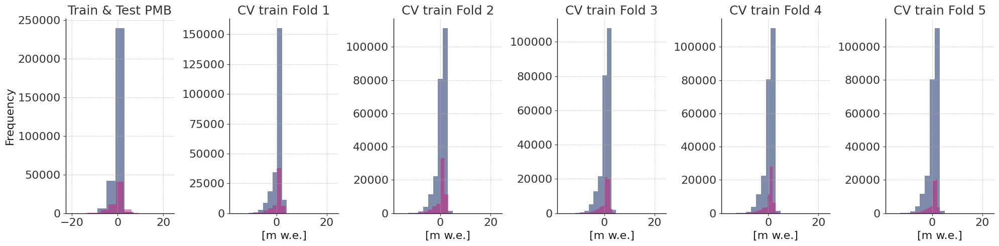

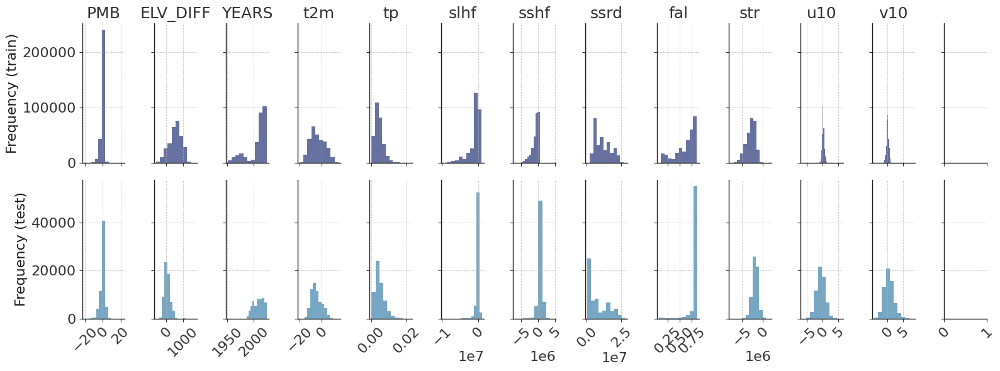

In [92]:
splits, test_set, train_set = get_CV_splits(dataloader_gl,
                                            test_split_on='GLACIER',
                                            test_splits=test_glaciers,
                                            random_state=cfg.seed)

print('Test glaciers: ({}) {}'.format(len(test_set['splits_vals']),
                                      test_set['splits_vals']))
test_perc = (len(test_set['df_X']) / len(train_set['df_X'])) * 100
print('Percentage of test size: {:.2f}%'.format(test_perc))
print('Size of test set:', len(test_set['df_X']))
print('Train glaciers: ({}) {}'.format(len(train_set['splits_vals']),
                                       train_set['splits_vals']))
print('Size of train set:', len(train_set['df_X']))

visualiseSplits(test_set['y'], train_set['y'], splits)
visualiseInputs(train_set, test_set, vois_climate)

In [ ]:
# This cells takes over 10 minuts to execute

# plot distributions of test glaciers:
f, ax = plt.subplots(len(test_glaciers),
                     len(vois_climate) + 3,
                     figsize=(16, 10),
                     sharey='row',
                     sharex='col')

for i, test_gl in enumerate(test_glaciers):
    test_df_gl = test_set['df_X'][test_set['df_X'].GLACIER == test_gl]
    test_df_gl['POINT_BALANCE'].plot.hist(ax=ax[i, 0],
                                          color=color_dark_blue,
                                          alpha=0.6,
                                          density=False)
    ax[i, 0].set_title('PMB')
    ax[i, 0].set_ylabel(test_gl)
    ax[i, 0].set_xlabel('[m w.e.]')
    test_df_gl['ELEVATION_DIFFERENCE'].plot.hist(ax=ax[i, 1],
                                                 color=color_dark_blue,
                                                 alpha=0.6,
                                                 density=False)
    ax[i, 1].set_title('ELV_DIFF]')
    ax[i, 1].set_xlabel('[m]')

    for j, voi_clim in enumerate(vois_climate):
        ax[i, 2 + j].set_title(voi_clim)
        test_df_gl[voi_clim].plot.hist(ax=ax[i, 2 + j],
                                       color=color_dark_blue,
                                       alpha=0.6,
                                       density=False)
        ax[i, 2 + j].set_xlabel(vois_units[voi_clim])

plt.tight_layout()

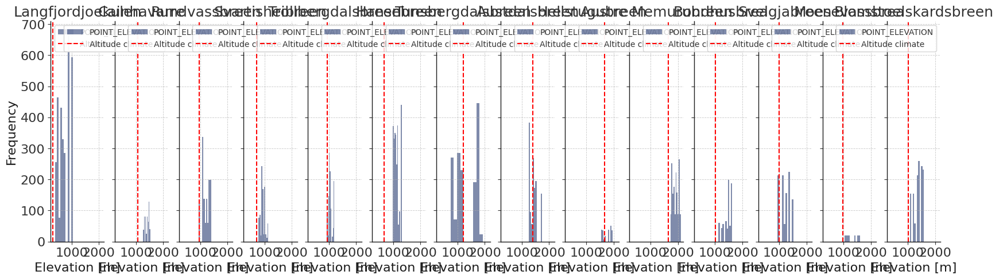

In [20]:
f, ax = plt.subplots(1,
                     len(test_glaciers),
                     figsize=(20, 5),
                     sharey='row',
                     sharex='row')

for i, test_gl in enumerate(test_glaciers):
    test_df_gl = test_set['df_X'][test_set['df_X'].GLACIER == test_gl]
    test_df_gl.POINT_ELEVATION.plot.hist(color=color_dark_blue,
                                         alpha=0.5,
                                         density=False,
                                         ax=ax[i])
    # add vertical line for altitude climate
    alt_climate = test_df_gl.ALTITUDE_CLIMATE.mean()
    ax[i].axvline(x=alt_climate,
                  color='red',
                  linestyle='--',
                  label='Altitude climate')
    ax[i].set_xlabel('Elevation [m]')
    ax[i].legend()
    ax[i].set_title(test_gl)
plt.tight_layout()

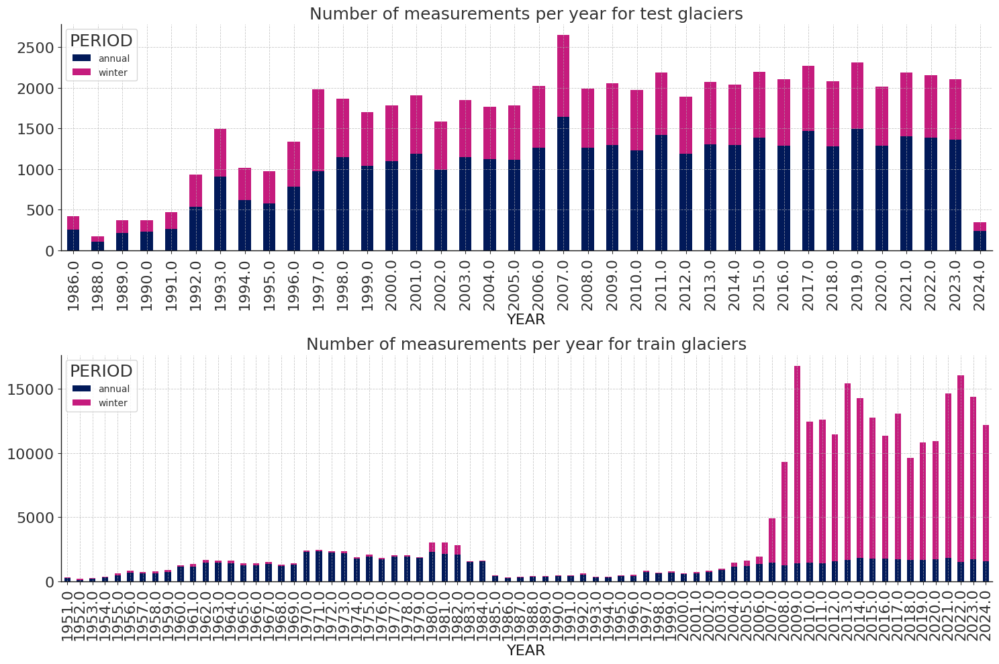

In [36]:
# Number of measurements per year:
fig, ax = plt.subplots(2, 1, figsize=(15, 10))
data_test.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar', stacked=True, color=[color_dark_blue, color_pink], ax=ax[0])
ax[0].set_title('Number of measurements per year for test glaciers')

# Number of measurements per year:
data_train.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar', stacked=True, color=[color_dark_blue, color_pink], ax=ax[1])
ax[1].set_title('Number of measurements per year for train glaciers')
plt.tight_layout()

#### XGBoost

In [38]:
# Grid search
# For each of the XGBoost parameter, define the grid range
param_grid = {
    'max_depth': [2, 3, 4, 5, 6, 7, 8],
    'n_estimators':
    [50, 100, 200, 300, 400, 500, 600,
     700],  # number of trees (too many = overfitting, too few = underfitting)
    'learning_rate': [0.01, 0.1, 0.15, 0.2, 0.25, 0.3]
}

param_init = {}
param_init['device'] = 'cuda:0'
param_init['tree_method'] = 'hist'
param_init["random_state"] = cfg.seed
param_init["n_jobs"] = cfg.numJobs

vois_climate = [
    't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10'
]

vois_topographical = [
    "aspect",
    "slope",
    #"hugonnet_dhdt",
    "consensus_ice_thickness",
    "millan_v",
]

#### Grid Search

In [ ]:
%%time
# Feature columns:
feature_columns = [
    'ELEVATION_DIFFERENCE'
] + list(vois_climate) + list(vois_topographical)
all_columns = feature_columns + cfg.fieldsNotFeatures
df_X_train_subset = train_set['df_X'][all_columns]
print('Shape of training dataset:', df_X_train_subset.shape)
print('Shape of testing dataset:', test_set['df_X'][all_columns].shape)
print('Running with features:', feature_columns)

RUN = False
if RUN:
    # Create a CustomXGBoostRegressor instance
    custom_xgboost = mbm.models.CustomXGBoostRegressor(cfg, **param_init)
    custom_xgboost.randomsearch(
        parameters=param_grid,
        n_iter=45,
        splits=splits,
        features=df_X_train_subset,
        targets=train_set['y'],
    )

    # save best model
    custom_xgboost.save_model(f'CH_train_ICE_test.pkl')
else:
    # read model
    custom_xgboost = mbm.models.CustomXGBoostRegressor(cfg)
    custom_xgboost.load_model(
        f'CH_train_ICE_test.pkl')

# Get best parameters and estimator
best_params = custom_xgboost.param_search.best_params_
best_estimator = custom_xgboost.param_search.best_estimator_
print("Best parameters:\n", best_params)
print("Best score:\n", custom_xgboost.param_search.best_score_)

# Make predictions on test:
# Set to CPU for predictions:
best_estimator_cpu = best_estimator.set_params(device='cpu')

# Make predictions on test
features_test, metadata_test = best_estimator_cpu._create_features_metadata(
    test_set['df_X'][all_columns])
y_pred = best_estimator_cpu.predict(features_test)
print('Shape of the test:', features_test.shape)

# Make predictions aggr to meas ID:
y_pred_agg = best_estimator_cpu.aggrPredict(metadata_test, features_test)

# Calculate scores
score = best_estimator_cpu.score(test_set['df_X'][all_columns],
                                 test_set['y'])  # negative
print('Overall score:', np.abs(score))

Shape of training dataset: (290682, 25)
Shape of testing dataset: (62425, 25)
Running with features: ['ELEVATION_DIFFERENCE', 't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10', 'aspect', 'slope', 'consensus_ice_thickness', 'millan_v']
Best parameters:
 {'n_estimators': 500, 'max_depth': 8, 'learning_rate': 0.01}
Best score:
 -0.19564066187781454
Shape of the test: (62425, 14)
Overall score: 4.762336860154793
CPU times: user 5.84 s, sys: 271 ms, total: 6.11 s
Wall time: 442 ms


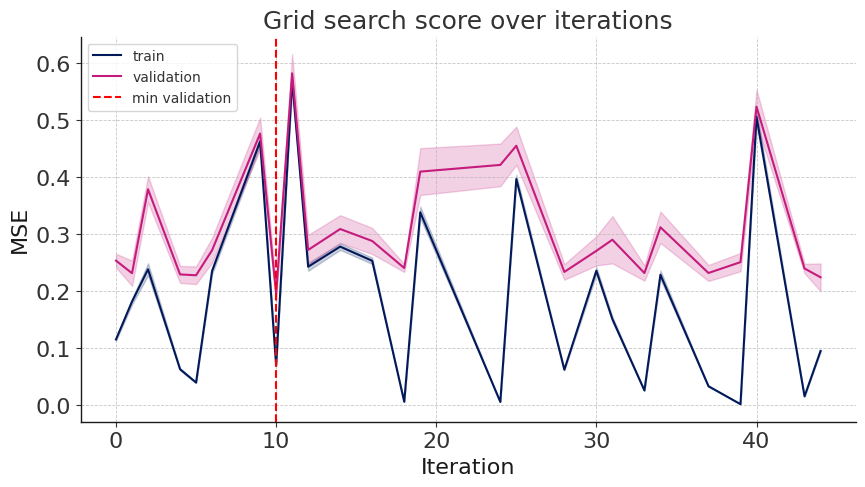

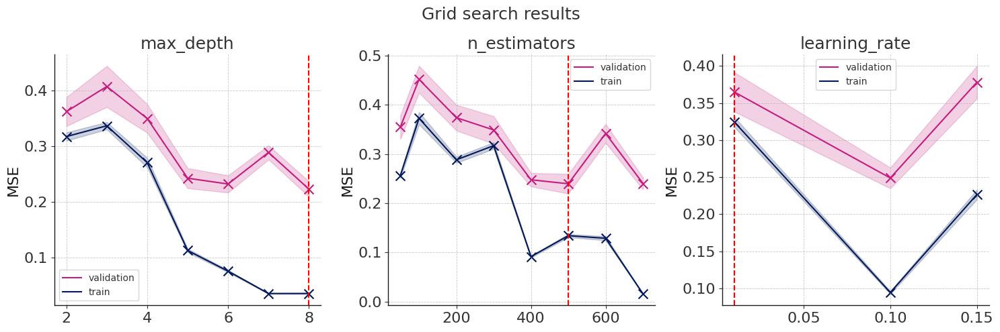

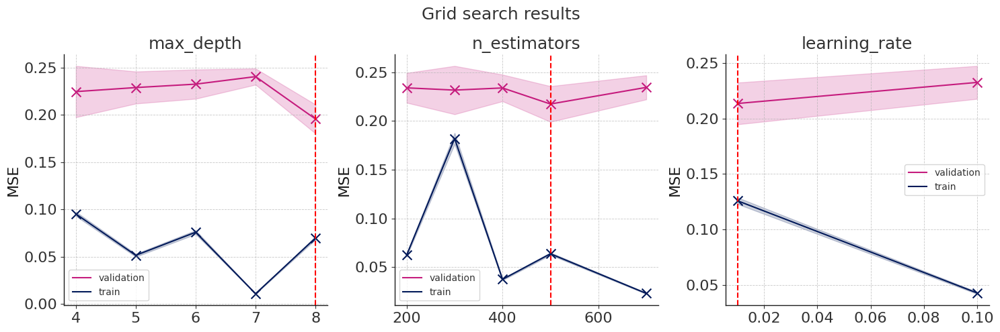

In [94]:
plotGridSearchScore(cv_results_=custom_xgboost.param_search.cv_results_,
                    lossType=cfg.loss)
plotGridSearchParams(custom_xgboost.param_search.cv_results_,
                     param_grid,
                     lossType=cfg.loss)
plotGridSearchParams(custom_xgboost.param_search.cv_results_,
                     param_grid,
                     lossType=cfg.loss,
                     N=10)

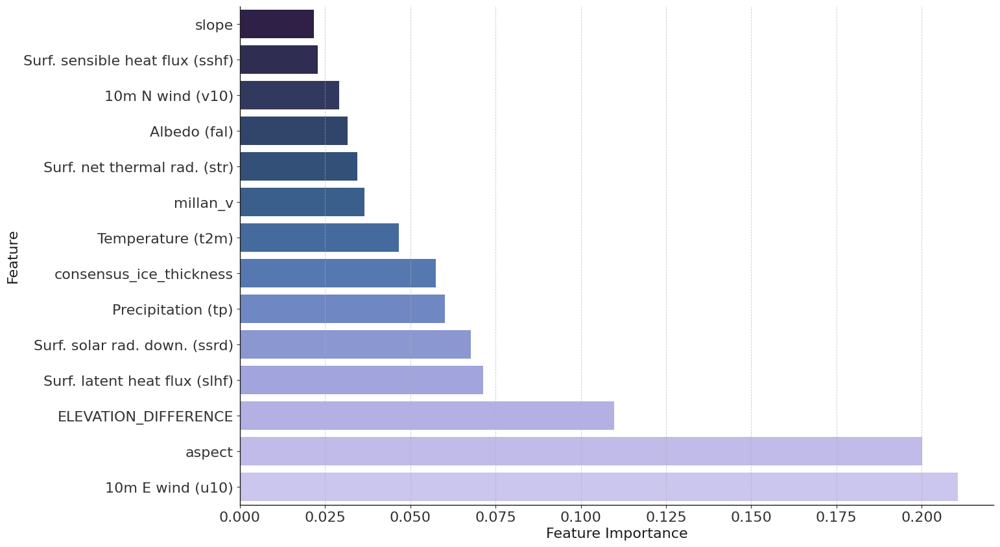

In [95]:
FIPlot(best_estimator, feature_columns, vois_climate)

Shape of the test: (62425, 14)


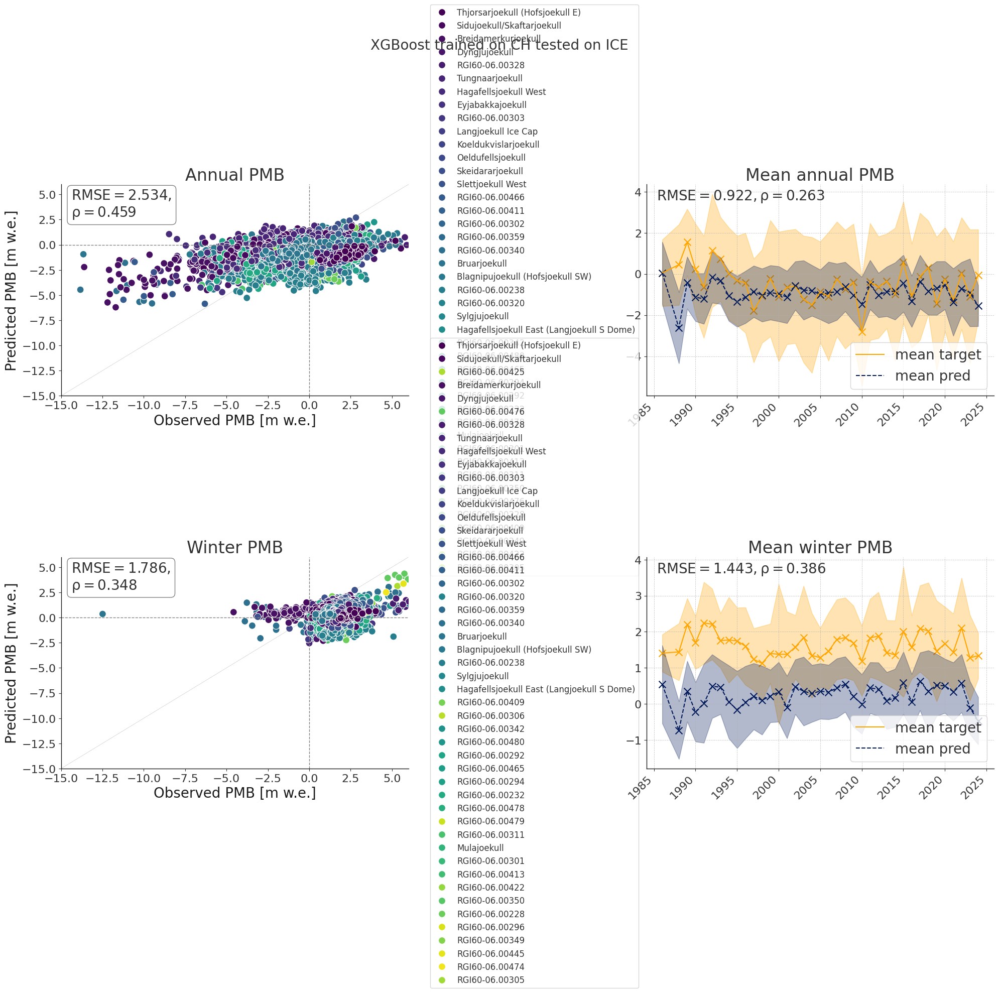

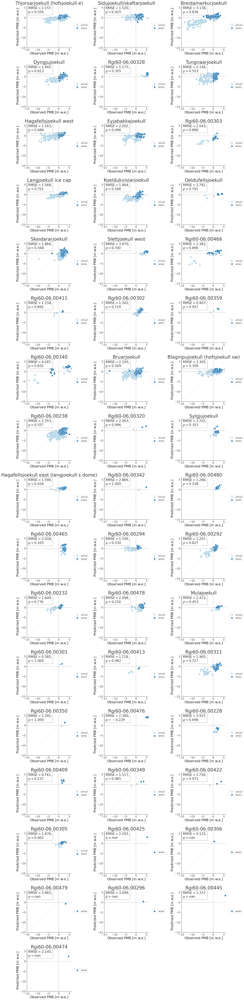

In [98]:
# Make predictions on test:
# Set to CPU for predictions:
best_estimator_cpu = best_estimator.set_params(device='cpu')

features_test, metadata_test = best_estimator_cpu._create_features_metadata(
    test_set['df_X'][all_columns])
y_pred = best_estimator_cpu.predict(features_test)
print('Shape of the test:', features_test.shape)

y_pred_agg = best_estimator_cpu.aggrPredict(metadata_test, features_test)
grouped_ids = getDfAggregatePred(test_set, y_pred_agg, all_columns)
PlotPredictions(grouped_ids, y_pred, metadata_test, test_set,
                best_estimator_cpu)
plt.suptitle(f'XGBoost trained on CH tested on ICE', fontsize=20)
plt.tight_layout()

PlotIndividualGlacierPredVsTruth(grouped_ids, base_figsize=(20, 15))

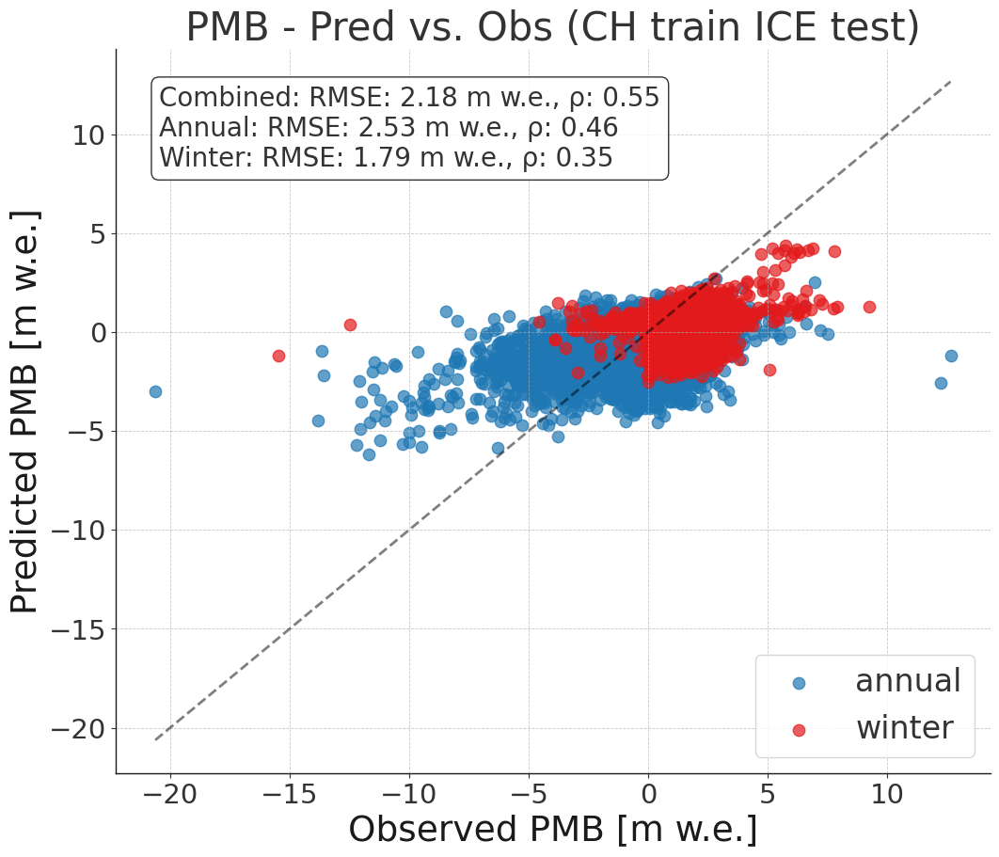

In [99]:
PlotPredictionsCombined(grouped_ids, y_pred, metadata_test, test_set,
                best_estimator_cpu, region_name='CH train ICE test')

### Predictions of custom parameters:

In [ ]:
custom_params = {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 800}

# Feature columns:
feature_columns = [
    'ELEVATION_DIFFERENCE'
] + list(vois_climate) + list(vois_topographical) + ['pcsr']
# feature_columns = ['ELEVATION_DIFFERENCE'
#                    ] + list(vois_climate) + list(vois_topographical)
all_columns = feature_columns + cfg.fieldsNotFeatures
df_X_train_subset = train_set['df_X'][all_columns]
print('Shape of training dataset:', df_X_train_subset.shape)
print('Shape of testing dataset:', test_set['df_X'][all_columns].shape)
print('Running with features:', feature_columns)

params = {**param_init, **custom_params}
print(params)
custom_model = mbm.models.CustomXGBoostRegressor(cfg, **params)

# Fit on train data:
custom_model.fit(train_set['df_X'][all_columns], train_set['y'])

# Make predictions on test
custom_model = custom_model.set_params(device='cpu')
features_test, metadata_test = custom_model._create_features_metadata(
    test_set['df_X'][all_columns])
y_pred = custom_model.predict(features_test)
print('Shape of the test:', features_test.shape)

# Make predictions aggr to meas ID:
y_pred_agg = custom_model.aggrPredict(metadata_test, features_test)

# Calculate scores
score = custom_model.score(test_set['df_X'][all_columns],
                           test_set['y'])  # negative
print('Overall score:', np.abs(score))

grouped_ids = getDfAggregatePred(test_set, y_pred_agg, all_columns)
PlotPredictions(grouped_ids, y_pred, metadata_test, test_set, custom_model)
plt.suptitle(f'MBM tested on {test_glaciers}', fontsize=20)
plt.tight_layout()

In [ ]:
# Aggregate predictions to annual or winter:
PlotIndividualGlacierPredVsTruth(grouped_ids, figsize=(20, 15))

In [ ]:
FIPlot(custom_model, feature_columns, vois_climate)